In [1]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

# Cargar archivos

In [2]:
data_path_posts = "./data/new_variables_data.xlsx"
df_posts = pd.read_excel(data_path_posts, parse_dates=['Posted At'])

In [3]:
data_path_comments = "./data/new_variables_comments.xlsx"
df_comments = pd.read_excel(data_path_comments)

# Usar solo columnas útiles

## Posts

In [4]:
df_posts.dtypes

Unnamed: 0                                                      int64
Content                                                        object
Post Type                                                      object
Attachments                                                    object
Post Url                                                       object
Posted At                                              datetime64[ns]
Comment Count                                                   int64
Reaction Count                                                  int64
Like Reaction Count                                             int64
Love Reaction Count                                             int64
Funny Reaction Count                                            int64
Angry Reaction Count                                            int64
Wow Reaction Count                                              int64
Sad Reaction Count                                              int64
Shared Count        

In [5]:
df_posts.drop(['nmf_4', 'lda_6'], axis=1, inplace=True)

In [6]:
df_posts.rename(columns={"Unnamed: 0": "ID"}, inplace=True)

In [7]:
df_posts.dtypes

ID                                                              int64
Content                                                        object
Post Type                                                      object
Attachments                                                    object
Post Url                                                       object
Posted At                                              datetime64[ns]
Comment Count                                                   int64
Reaction Count                                                  int64
Like Reaction Count                                             int64
Love Reaction Count                                             int64
Funny Reaction Count                                            int64
Angry Reaction Count                                            int64
Wow Reaction Count                                              int64
Sad Reaction Count                                              int64
Shared Count        

## Comentarios

In [8]:
df_comments.dtypes

Unnamed: 0                  int64
ID                          int64
Comment                    object
comments_no_emoji          object
comments_basic_clean       object
Contains_Emoji               bool
Contains_GIF                 bool
Contains_Image               bool
Contains_link                bool
content length              int64
word lengths               object
mean length               float64
max length                  int64
min length                  int64
median length             float64
nmf_4                       int64
lda_4                       int64
topic                      object
Sentiment_Pysentimento     object
Sentiment_GPT              object
dtype: object

In [9]:
df_comments.drop(['nmf_4', 'lda_4'], axis=1, inplace=True)

In [10]:
df_comments.dtypes

Unnamed: 0                  int64
ID                          int64
Comment                    object
comments_no_emoji          object
comments_basic_clean       object
Contains_Emoji               bool
Contains_GIF                 bool
Contains_Image               bool
Contains_link                bool
content length              int64
word lengths               object
mean length               float64
max length                  int64
min length                  int64
median length             float64
topic                      object
Sentiment_Pysentimento     object
Sentiment_GPT              object
dtype: object

# EDA y minería

In [11]:
# Solo de elementos que no sean preferibles mediante Tableau

## Métricas en polaridad de sentimientos

In [12]:
from sklearn.metrics import confusion_matrix

### Sample

In [13]:
random_sample = df_comments.sample(n=100, random_state=42)

In [14]:
tag_sentiment = [
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEU',
    'NEG',
    'POS',
    'NEU',
    'POS',
    'NEG',
    'NEU',
    'NEU',
    'POS',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEU',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'POS',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'POS',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEU',
    'NEU',
    'NEU',
    'NEG',
    'NEG',
    'NEG',
    'NEU',
    'NEU',
    'NEU',
    'POS',
    'NEG',
    'NEG',
    'NEG',
    'NEG',
    'POS',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
    'NEU',
    'NEU',
    'NEG',
    'NEG',
    'NEG',
    'POS',
    'POS',
    'NEG',
    'NEU',
    'NEG',
    'NEG',
]

In [15]:
random_sample["tag"] = tag_sentiment

In [16]:
random_sample.to_excel("data/random_100_sample_comments.xlsx")

In [17]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.preprocessing import LabelEncoder

### Pysentimiento

In [18]:
y_true = random_sample['tag']
y_pred = random_sample['Sentiment_Pysentimento']

label_encoder = LabelEncoder()
y_true_encoded = label_encoder.fit_transform(y_true)
y_pred_encoded = label_encoder.transform(y_pred)

precision = precision_score(y_true_encoded, y_pred_encoded, average='weighted')
recall = recall_score(y_true_encoded, y_pred_encoded, average='weighted')
f1 = f1_score(y_true_encoded, y_pred_encoded, average='weighted')
accuracy = accuracy_score(y_true_encoded, y_pred_encoded)

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-score: {f1:.2f}')
print(f'Accuracy: {accuracy:.2f}')

Precision: 0.90
Recall: 0.88
F1-score: 0.88
Accuracy: 0.88


In [19]:
conf_matrix_pysentimento = confusion_matrix(y_true, y_pred, labels=['POS', 'NEG', 'NEU'])

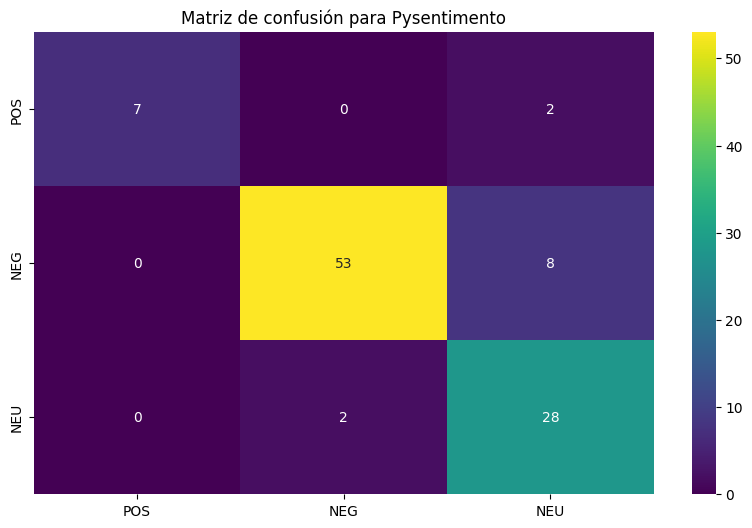

In [20]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix_pysentimento, annot=True, fmt='d', cmap='viridis', xticklabels=['POS', 'NEG', 'NEU'], yticklabels=['POS', 'NEG', 'NEU'])
plt.title('Matriz de confusión para Pysentimento')
plt.show()

### GPT 3.5

In [21]:
y_true = random_sample['tag']
y_pred = random_sample['Sentiment_GPT']

label_encoder = LabelEncoder()
y_true_encoded = label_encoder.fit_transform(y_true)
y_pred_encoded = label_encoder.transform(y_pred)

precision = precision_score(y_true_encoded, y_pred_encoded, average='weighted')
recall = recall_score(y_true_encoded, y_pred_encoded, average='weighted')
f1 = f1_score(y_true_encoded, y_pred_encoded, average='weighted')
accuracy = accuracy_score(y_true_encoded, y_pred_encoded)

print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
print(f'F1-score: {f1:.2f}')
print(f'Accuracy: {accuracy:.2f}')

Precision: 0.86
Recall: 0.82
F1-score: 0.83
Accuracy: 0.82


In [22]:
conf_matrix_gpt = confusion_matrix(y_true, y_pred, labels=['POS', 'NEG', 'NEU'])

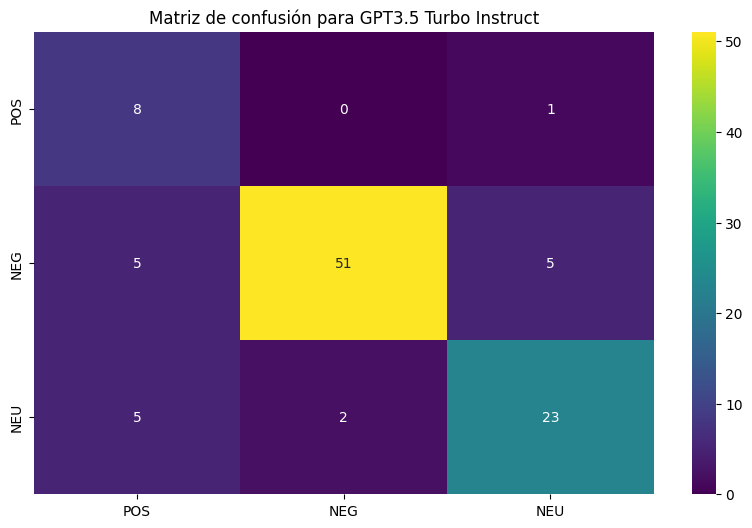

In [23]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix_gpt, annot=True, fmt='d', cmap='viridis', xticklabels=['POS', 'NEG', 'NEU'], yticklabels=['POS', 'NEG', 'NEU'])
plt.title('Matriz de confusión para GPT3.5 Turbo Instruct')
plt.show()

* Se utiliza Pysentimento debido a que tiene mejor rendimiento para la tarea que GPT3.5 Instruct y además se aprecia que no generó confusión entre etiquetas positivas y negativas

## Test Log Normal Posts

In [24]:
post_quantitative_variables = ['Comment Count', 'Reaction Count', 'Shared Count']

In [25]:
for post_quantitative_variable in post_quantitative_variables:
    log_data = np.exp(df_posts[post_quantitative_variable])
    statistic, p_value = stats.shapiro(log_data)
    print(f"{post_quantitative_variable} tiene un p-value {p_value} para Shapiro")
    print(log_data)

Comment Count tiene un p-value 1.0 para Shapiro
0       1.907347e+21
1       7.389056e+00
2       1.096633e+03
3       4.424134e+05
4       2.980958e+03
            ...     
2614    1.000000e+00
2615    1.000000e+00
2616    1.000000e+00
2617    5.459815e+01
2618    9.253782e+29
Name: Comment Count, Length: 2619, dtype: float64
Reaction Count tiene un p-value 1.0 para Shapiro
0       1.627548e+05
1       4.034288e+02
2       2.202647e+04
3       8.886111e+06
4       5.987414e+04
            ...     
2614    7.200490e+10
2615    1.202604e+06
2616    4.851652e+08
2617    7.200490e+10
2618    7.120586e+53
Name: Reaction Count, Length: 2619, dtype: float64
Shared Count tiene un p-value 1.0 para Shapiro
0       1.000000e+00
1       7.389056e+00
2       2.718282e+00
3       7.389056e+00
4       1.000000e+00
            ...     
2614    4.034288e+02
2615    2.718282e+00
2616    2.008554e+01
2617    7.389056e+00
2618    7.016736e+20
Name: Shared Count, Length: 2619, dtype: float64


/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1811: RuntimeWarning: overflow encountered in cast
  a, w, pw, ifault = _statlib.swilk(y, a[:N//2], init)


## Agregación de sentimiento y tópicos desde comentarios a posts

In [26]:
pivot_df = df_comments.pivot_table(index=['ID'], columns=['topic', 'Sentiment_Pysentimento'], aggfunc='size', fill_value=0)

In [27]:
pivot_df.columns = ['_'.join(map(str, col)) for col in pivot_df.columns.values]

In [28]:
pivot_df.head()

,Fallas y reclamos_NEG,Fallas y reclamos_NEU,Fallas y reclamos_POS,"Fútbol, deportes y televisión_NEG","Fútbol, deportes y televisión_NEU","Fútbol, deportes y televisión_POS",Internet_NEG,Internet_NEU,Internet_POS,Solicitud de información_NEG,Solicitud de información_NEU,Solicitud de información_POS
ID,,,,,,,,,,,,
0,7,0,0,0,1,0,6,1,0,0,2,0
1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,2,0,0,3,0,0,0,0,0,0,0
3,4,1,0,0,0,0,0,1,0,0,0,0
4,1,2,0,0,0,0,0,0,0,0,0,0


In [29]:
pivot_df.shape

(1812, 12)

In [30]:
df_posts.head()

,ID,Content,Post Type,Attachments,Post Url,Posted At,Comment Count,Reaction Count,Like Reaction Count,Love Reaction Count,...,with attachment,without attachment,content length,word count,word lengths,mean length,max length,min length,median length,topic
0,0,Empezamos este viernes 1ro de Mayo con mucha d...,album,photo,https://www.facebook.com/ComtecoRL/posts/pfbid...,2015-01-05 20:41:00,49,12,12,0,...,True,False,56,8,"[7, 5, 3, 4, 5, 9, 9, 7]",6.125000,9,3,6.0,"Fútbol, deportes y televisión"
1,1,Disfruta de la conexión Comteco,photo,photo,https://www.facebook.com/ComtecoRL/photos/a.12...,2015-01-07 11:00:00,2,6,6,0,...,True,False,26,3,"[9, 8, 7]",8.000000,9,7,8.0,"Fútbol, deportes y televisión"
2,2,"Con Comteco, más entretenimiento mejor servicio.",photo,photo,https://www.facebook.com/ComtecoRL/photos/a.12...,2015-01-08 10:00:00,7,10,10,0,...,True,False,38,4,"[7, 15, 5, 8]",8.750000,15,5,7.5,"Fútbol, deportes y televisión"
3,3,¿Se te hace familiar?,photo,photo,https://www.facebook.com/ComtecoRL/photos/a.12...,2015-01-08 16:09:00,13,16,16,0,...,True,False,14,2,"[5, 8]",6.500000,8,5,6.5,"Aplicaciones, facturación, deportes y otros"
4,4,Con el PLAN DE INTERNET GANA GANA todos podemo...,photo,photo,https://www.facebook.com/ComtecoRL/photos/a.12...,2015-01-09 15:01:00,8,11,11,0,...,True,False,46,7,"[4, 8, 5, 5, 5, 9, 4]",5.714286,9,4,5.0,"Internet, publicidad, servicios y soporte"


In [31]:
merged_df = pd.merge(df_posts, pivot_df, on='ID', how='left')

In [32]:
merged_df.shape

(2619, 42)

In [33]:
merged_df.dtypes

ID                                                              int64
Content                                                        object
Post Type                                                      object
Attachments                                                    object
Post Url                                                       object
Posted At                                              datetime64[ns]
Comment Count                                                   int64
Reaction Count                                                  int64
Like Reaction Count                                             int64
Love Reaction Count                                             int64
Funny Reaction Count                                            int64
Angry Reaction Count                                            int64
Wow Reaction Count                                              int64
Sad Reaction Count                                              int64
Shared Count        

In [34]:
merged_df.fillna(0, inplace=True)

In [35]:
merged_df.to_excel("data/final_posts.xlsx")

## Min Max

In [36]:
def min_max_normalize(data):
    min_val = min(data)
    max_val = max(data)
    normalized_data = [(x - min_val) / (max_val - min_val) for x in data]
    return normalized_data

In [37]:
text = """comteco (2.19), tv (1.17), sorprender (0.84), siempre (0.78), fútbol (0.62), disfrutar (0.58), vivir (0.55), apoyar (0.55), gana (0.55), emoción (0.54)
plan (0.98), 4200400 (0.72), whatsapp (0.70), vía (0.70), llamar (0.69), link (0.69), seguir (0.66), fijo (0.64), internet (0.45), contratar (0.41)
go (0.83), servicio (0.51), factura (0.50), pagar (0.49), gestionar (0.47), comteco (0.45), apple (0.43), store (0.43), google (0.43), play (0.42)
actualizado (1.52), foto (1.47), portado (1.36), comteco (0.58), perfil (0.28), inalcanzable (0.01), ventaja (0.01), aguinaldo (0.01), conexión (0.01), beneficio (0.01)
"""
numbers = re.findall(r'\((\d+\.\d+)\)', text)
nmf_posts = [float(num) for num in numbers]
np.mean(min_max_normalize(nmf_posts))

0.2847477064220183

In [38]:
text = """semana (0.0071), fin (0.0068), seguro (0.0068), comteco (0.0067), foto (0.0065), actualizado (0.0065), recomendación (0.0056), portado (0.0047), partido (0.0039), tv (0.0039)
hoy (0.0067), comteco (0.0058), fútbol (0.0056), conéctatar (0.0055), semana (0.0055), tv (0.0052), club (0.0051), wilstermann (0.0048), jorge (0.0043), fin (0.0043)
plan (0.0037), internet (0.0037), aquí (0.0036), día (0.0035), aguinaldo (0.0034), innovación (0.0031), año (0.0031), clausura (0.0029), comteco (0.0027), wifi (0.0027)
fijo (0.0080), aquí (0.0072), comteco (0.0063), servicio (0.0062), whatsapp (0.0061), vía (0.0058), go (0.0054), telefonir (0.0048), max (0.0047), realizar (0.0046)
contáctano (0.0175), cochabamba (0.0043), seguro (0.0038), ingrés (0.0035), bs (0.0034), información (0.0033), bolivia (0.0032), comteco (0.0032), on (0.0029), tv (0.0029)
inalcanzable (0.0140), whatsapp (0.0091), vía (0.0089), plan (0.0072), internacional (0.0072), fibra (0.0069), internet (0.0068), velocidad (0.0066), óptico (0.0066), feria (0.0064)
"""
numbers = re.findall(r'\((\d+\.\d+)\)', text)
lda_posts = [float(num) for num in numbers]
np.mean(min_max_normalize(lda_posts))

0.18975225225225226

In [39]:
text = """servicio (2.53), que (1.24), comteco (1.24), hacer (1.03), poder (0.94), si (0.85), pésimo (0.77), dar (0.76), pagar (0.62), querer (0.58)
información (3.38), favor (2.17), mas (0.81), por (0.65), informacion (0.35), precio (0.22), plan (0.19), querer (0.11), mayor (0.10), poder (0.10)
liga (3.32), boliviano (1.83), partido (1.04), transmitir (1.01), querer (0.28), ir (0.17), fútbol (0.17), comteco (0.16), sudamericano (0.15), bolivia (0.14)
internet (4.02), lento (1.05), arreglir (0.58), cortar (0.21), velocidad (0.20), seguir (0.19), vez (0.18), hora (0.16), pasar (0.16), día (0.15)
"""
numbers = re.findall(r'\((\d+\.\d+)\)', text)
nmf_comments = [float(num) for num in numbers]
np.mean(min_max_normalize(nmf_comments))

0.19011479591836739

In [40]:
text = """cobertura (0.0126), socio (0.0085), querer (0.0079), poder (0.0058), zona (0.0058), comteco (0.0057), liga (0.0056), ayudar (0.0055), bolivar (0.0052), llegar (0.0046)
excedente (0.0126), informacion (0.0114), descuento (0.0099), instalación (0.0078), sorteo (0.0076), pagar (0.0074), mas (0.0068), rojo (0.0066), saludo (0.0053), cuanto (0.0052)
información (0.0220), favor (0.0197), internet (0.0130), servicio (0.0113), poder (0.0084), mas (0.0080), por (0.0075), interesar (0.0072), pésimo (0.0069), querer (0.0069)
internet (0.0156), servicio (0.0127), comteco (0.0080), mejorar (0.0078), hacer (0.0078), peor (0.0068), que (0.0066), lento (0.0065), pagar (0.0063), mal (0.0053)
"""
numbers = re.findall(r'\((\d+\.\d+)\)', text)
lda_comments = [float(num) for num in numbers]
np.mean(min_max_normalize(lda_comments))

0.2271551724137931

## Correlación

In [41]:
selected_columns = [
    'Comment Count', 'Reaction Count', 'Shared Count', 'with attachment', 'without attachment', 'word count', 
    'median length', 'content length', 'Like Reaction Count', 'Love Reaction Count', 'Funny Reaction Count', 'Angry Reaction Count', 'Wow Reaction Count', 'Sad Reaction Count',
    'Fútbol, deportes y televisión_NEG', 'Fútbol, deportes y televisión_NEU', 'Fútbol, deportes y televisión_POS',
    'Solicitud de información_NEG', 'Solicitud de información_NEU', 'Solicitud de información_POS',
    'Internet_NEG', 'Internet_NEU', 'Internet_POS', 'Fallas y reclamos_NEG', 'Fallas y reclamos_NEU', 'Fallas y reclamos_POS'
]

In [42]:
df_selected = merged_df[selected_columns]
corr_matrix = df_selected.corr()

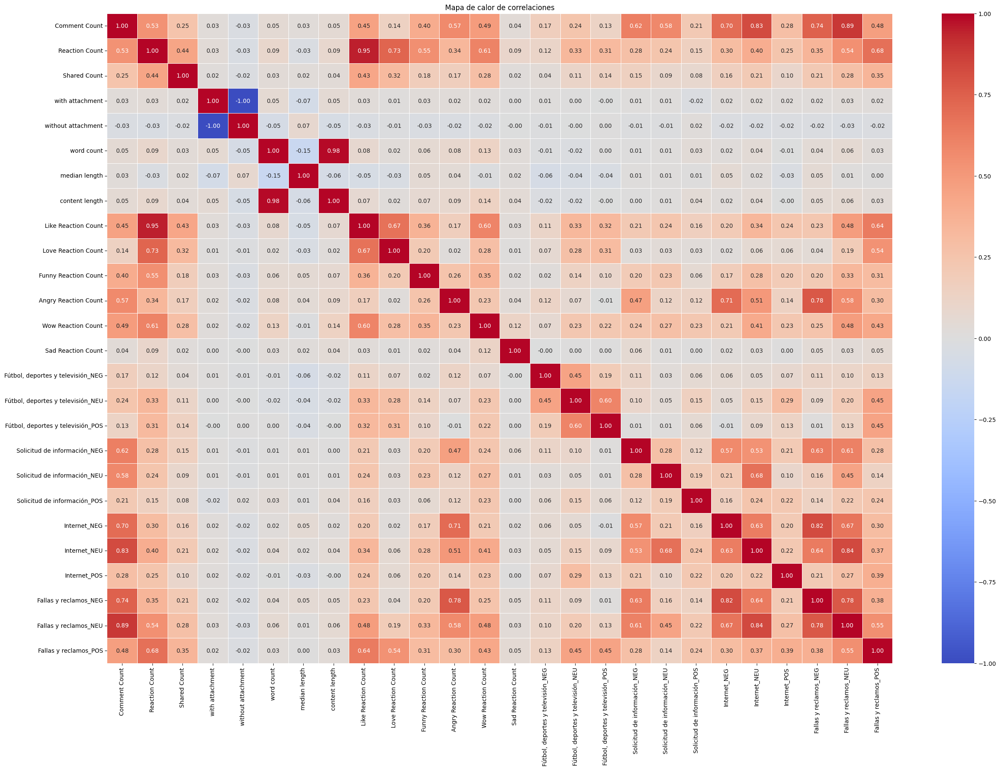

In [43]:
plt.figure(figsize=(30, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Mapa de calor de correlaciones')
plt.show()

### Correlación por tópico

In [44]:
unique_topics = merged_df['topic'].unique()

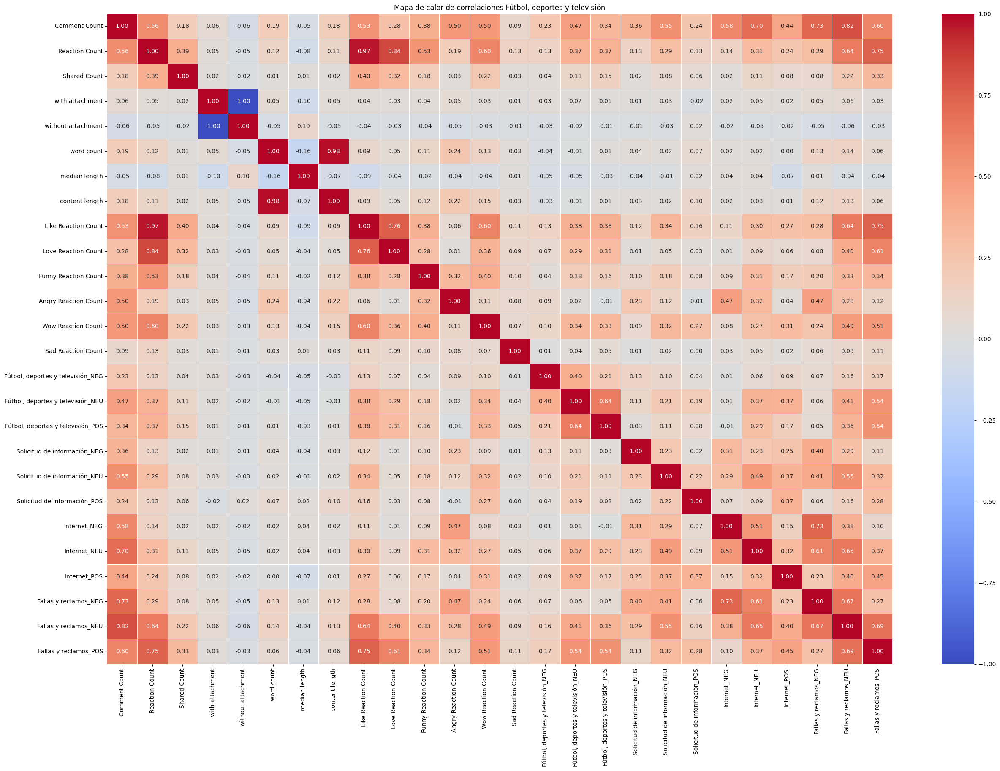

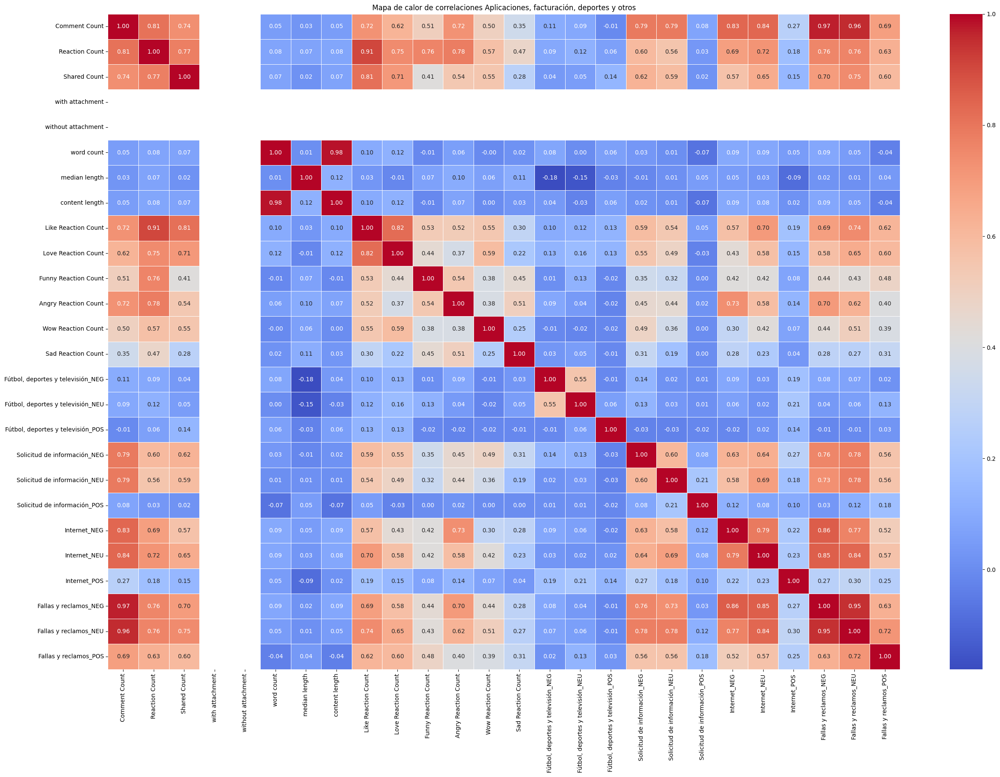

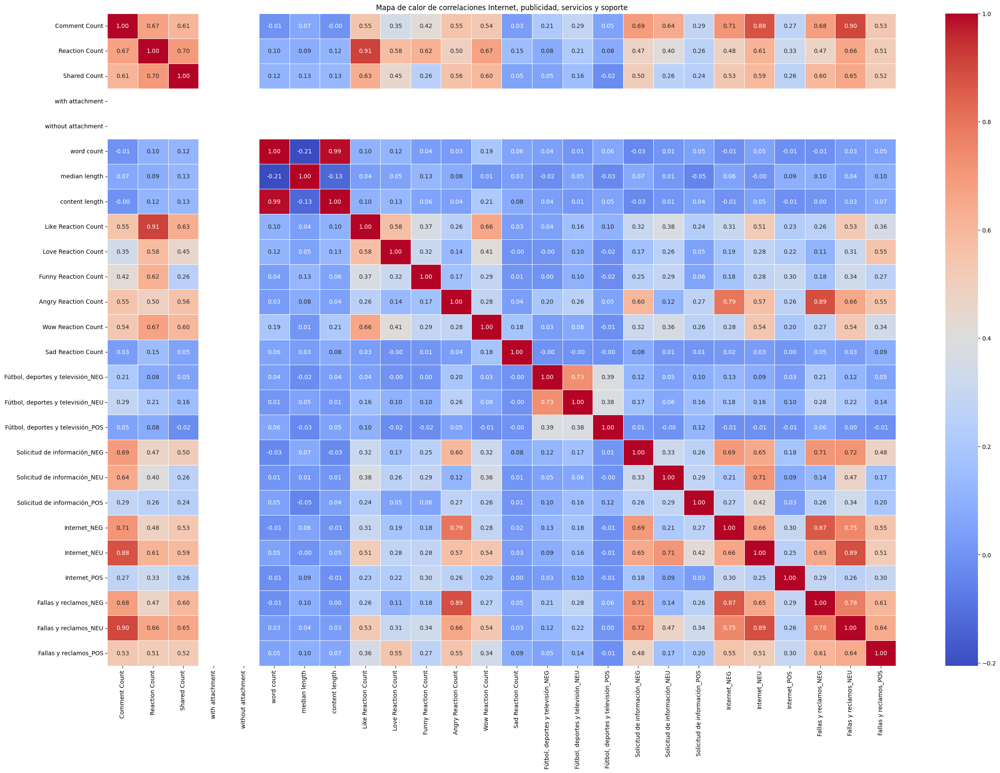

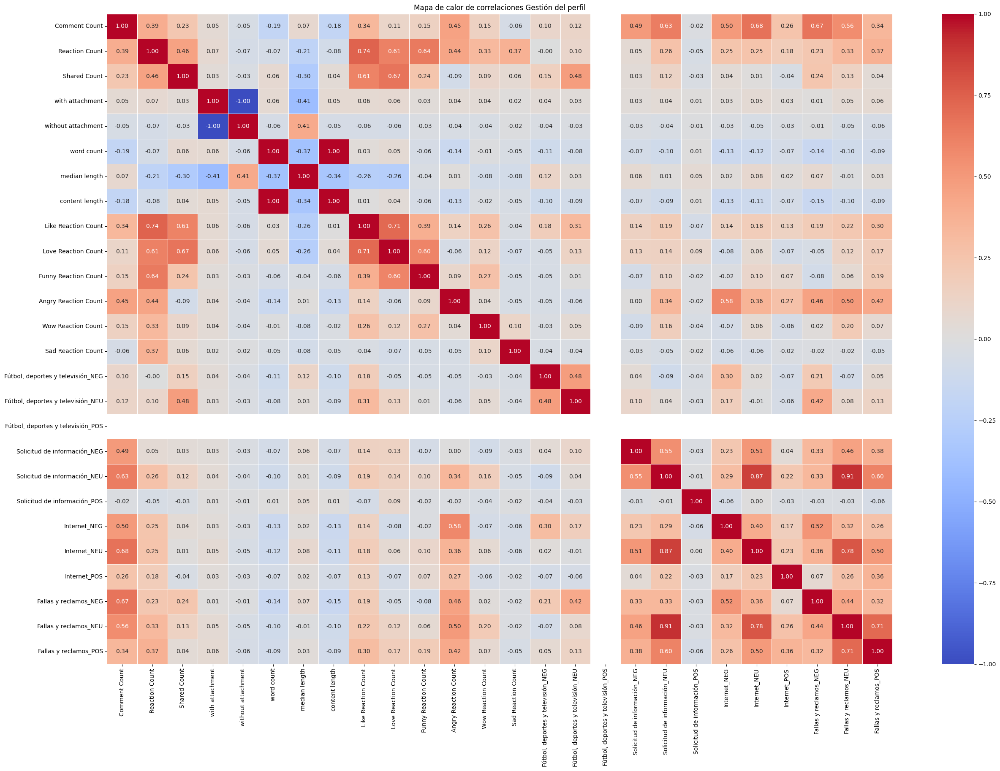

In [45]:
for topic in unique_topics:
    df_topic = merged_df[merged_df['topic'] == topic]
    df_selected = df_topic[selected_columns]
    corr_matrix = df_selected.corr()
    plt.figure(figsize=(30, 20))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title(f'Mapa de calor de correlaciones {topic}')
    plt.show()

## Nubes de palabras por tópico de comentarios

In [46]:
import re
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import spacy

2024-02-07 23:33:44.796082: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-07 23:33:45.551121: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-02-07 23:33:46.472940: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-07 23:33:46.473295: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [47]:
nlp = spacy.load("es_core_news_sm")

In [48]:
def preprocess_text(text):
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_punct and not token.is_stop]
    return tokens

# Create 3-grams
def generate_ngrams(tokens, n=3):
    ngrams = zip(*[tokens[i:] for i in range(n)])
    return [" ".join(ngram) for ngram in ngrams]

In [49]:
def plot_wordcloud_n_grams(texts):
    all_ngrams = []
    for text in texts:
        tokens = preprocess_text(str(text))
        ngrams = generate_ngrams(tokens, n=3)
        all_ngrams.extend(ngrams)
    text_for_wordcloud = " ".join(all_ngrams)
    wordcloud = WordCloud(width=800, height=400, background_color="white", max_words=25).generate(text_for_wordcloud)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

## Gestión del perfil

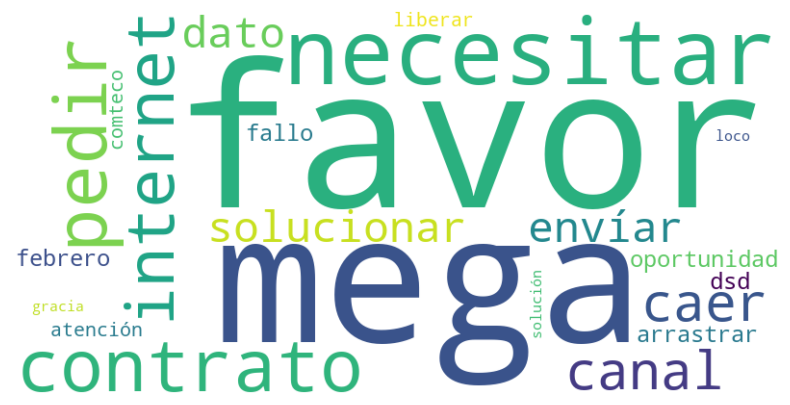

In [50]:
# Gestión del perfil, Solicitud de Información para Marzo
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 3)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

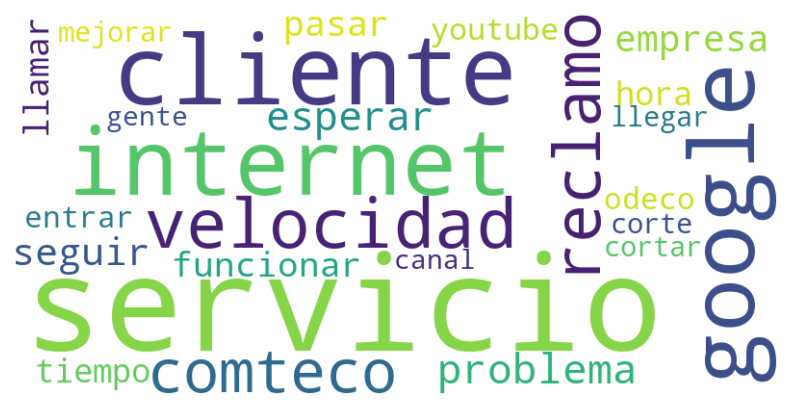

In [51]:
# Gestión del perfil, Fallas y reclamos e Internet para Abril
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 4)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

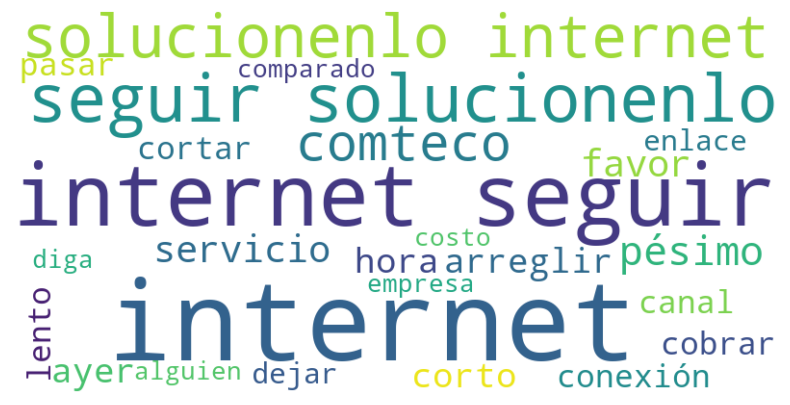

In [52]:
# Gestión del perfil, Fallas y reclamos e Internet para Julio
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 7)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

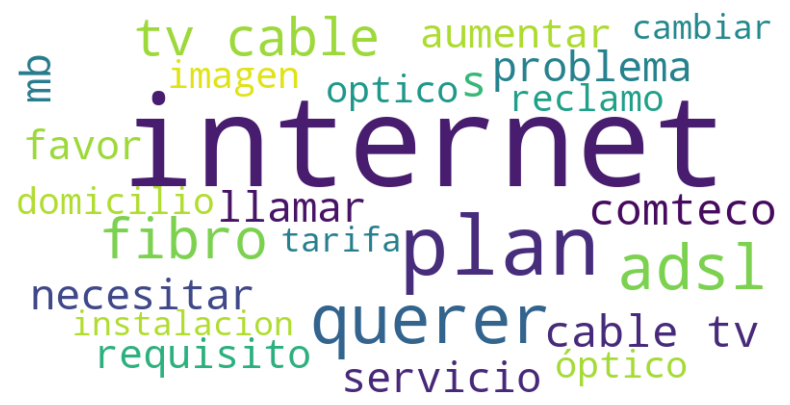

In [53]:
# Gestión del perfil, interacción neutral para Internet
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil")]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEU") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

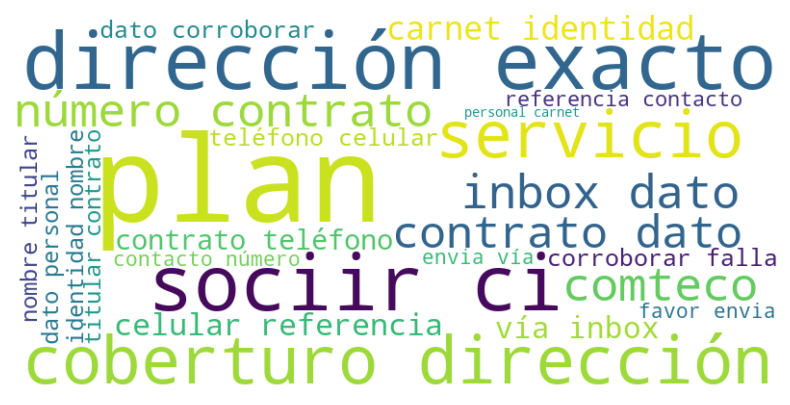

In [54]:
# Gestión del perfil, interacción neutral para Fallas y reclamos
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil")]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEU") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

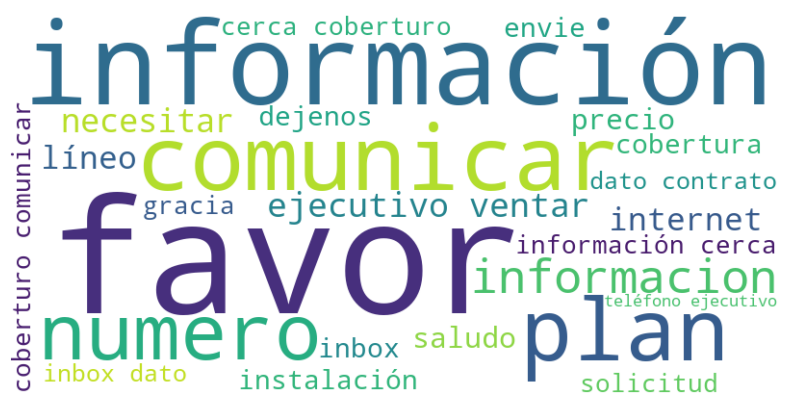

In [55]:
# Gestión del perfil, interacción neutral para Solicitud de información
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil")]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEU") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

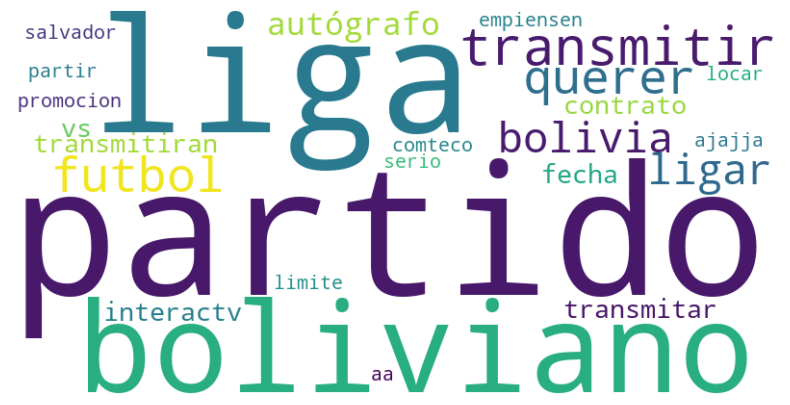

In [56]:
# Gestión del perfil, interacción neutral para Fútbol, deportes y televisión
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil")]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEU") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

## Internet

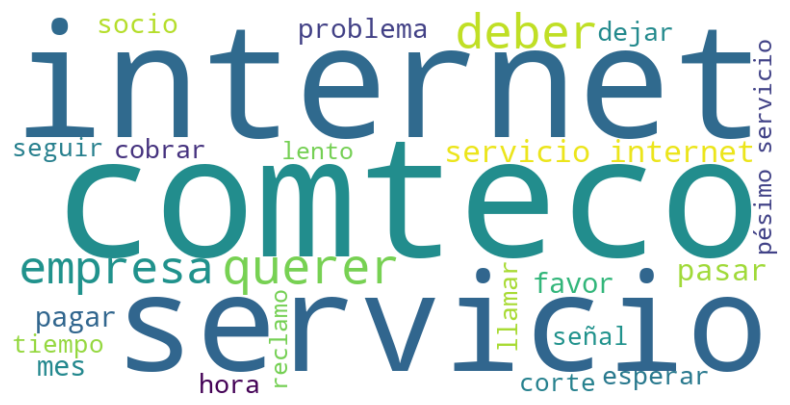

In [57]:
# Comentarios negativos
comments = list(df_comments[df_comments["Sentiment_Pysentimento"] == "NEG"]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

## Fútbol

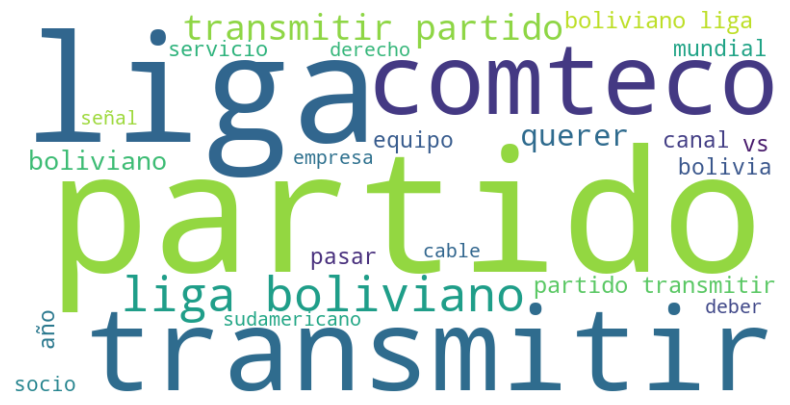

In [58]:
# Comentarios negativos
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG")]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

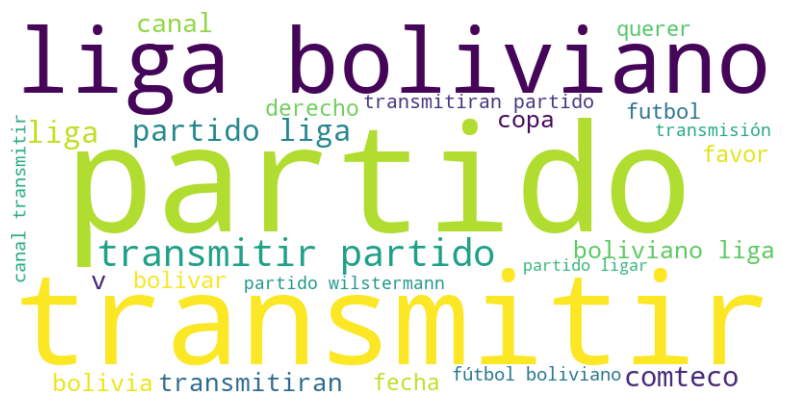

In [59]:
# Comentarios neutrales
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEU")]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

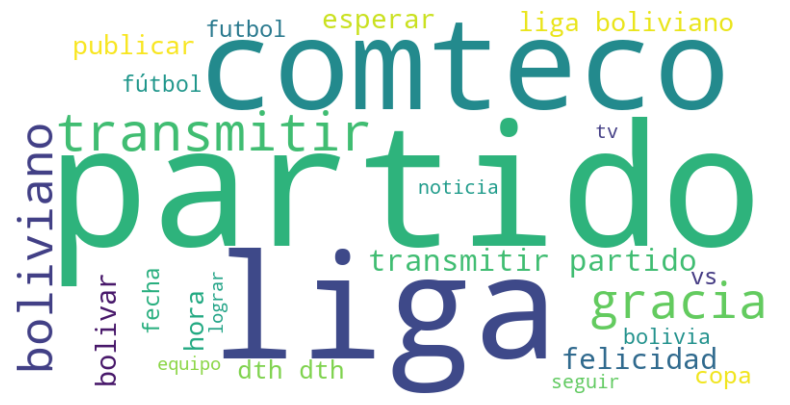

In [60]:
# Comentarios negativos
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "POS")]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

## Correlación eventos críticos

In [61]:
data_path_historical = "./data/historico.xlsx"
df_historical = pd.read_excel(data_path_historical)

In [62]:
df_selected_historical = df_historical[["Internet", "Fallas y reclamos", "Solicitud de información", "Fútbol, deportes y televisión"]]
corr_matrix_historical = df_selected_historical.corr()

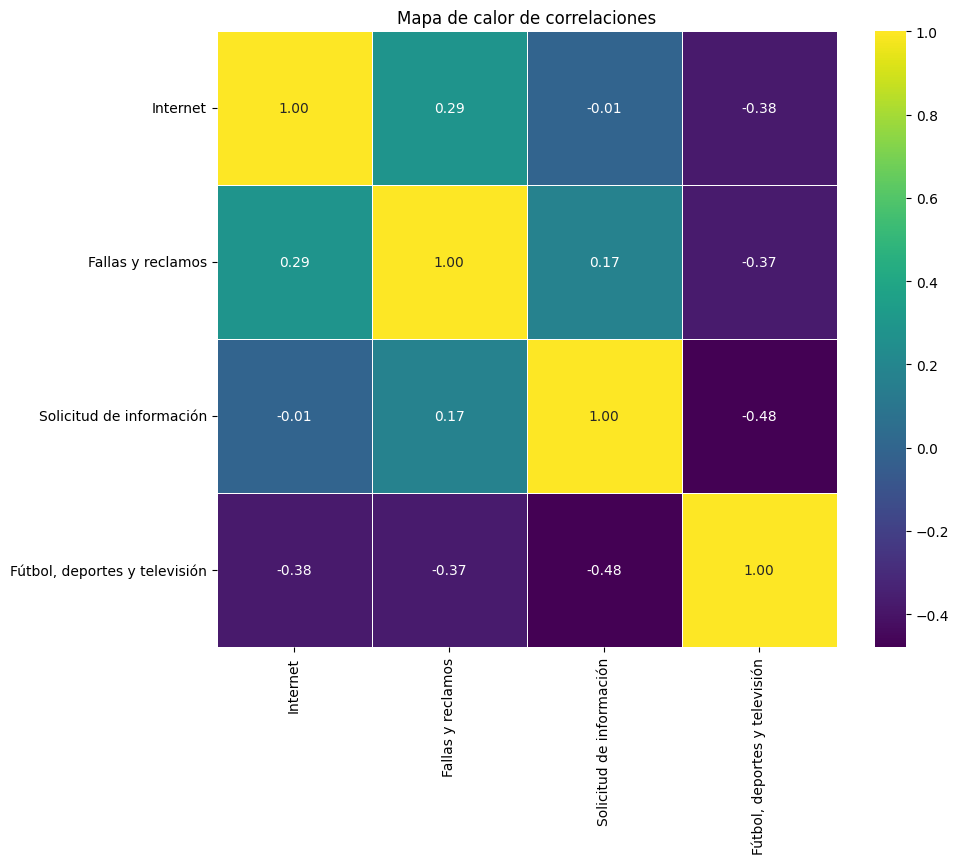

In [63]:
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix_historical, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title('Mapa de calor de correlaciones')
plt.show()

## Observación de históricos y causalidad

### Internet, publicidad, servicios y soporte 09/2016

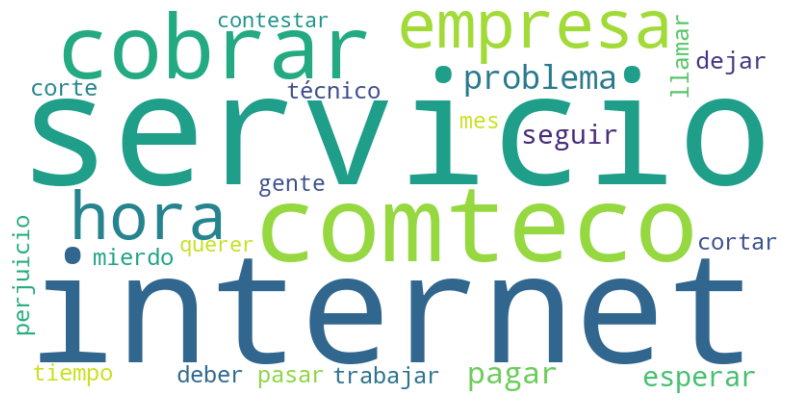

In [64]:
# Internet, publicidad, servicios y soporte 09/2016
ids = list(merged_df[(merged_df["topic"] == "Internet, publicidad, servicios y soporte") & (merged_df["Posted At"].dt.month == 9) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información", "Fallas y reclamos", "Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [65]:
comments

['podiar hacer equipo',
 'ofrecer principio luego servicio terrible dejar preocupar él cosa preocupense mejorar servicio atender mejor servicio',
 'pasar señal tv cable digital corto pixeleado quitar canal line reclamo descolgado',
 'todo semana dar señal igual cobrar reclame habia hacer burocratico papeleo definitivamnete administrar solo llenar bolsillo interesar ofrecer servicio calidad peor forma parar saqueador turno',
 'servicio internet nefasto pena empresa tanto grande buen servicio si mejorar precio cada ves subir subir cobrar lamentable servicio mejor publicidad',
 'realmente empresa mas sinverguenza que existir diar hoy pasar',
 'pues si mismo servicio hoy internet toooodar tarde pues gracias',
 'arreglir internet primero siempre mismo pesimo servicio',
 'mierdar internet comteco cortar cada rato dejar trabajar tarija paz sc potosi sucre internet calidad aqui mierdar mientras que aqui comteco mierda savir cobrar hijo puta personal mierdo llama telf tecnico mierdar telefonia 

### Internet, publicidad, servicios y soporte 06/2017

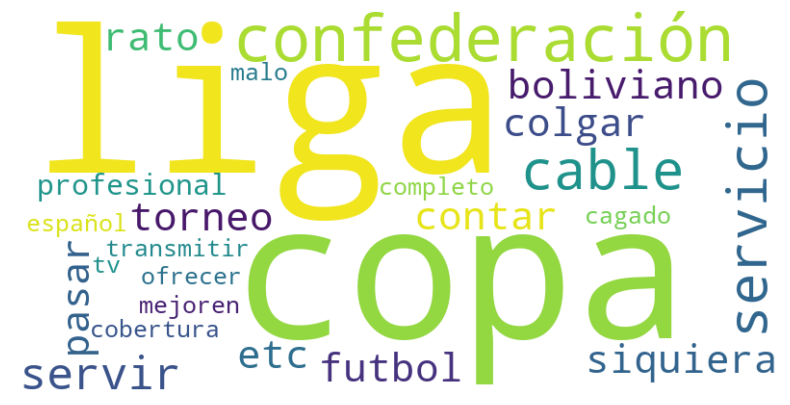

In [66]:
ids = list(merged_df[(merged_df["topic"] == "Internet, publicidad, servicios y soporte") & (merged_df["Posted At"].dt.month == 6) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [67]:
comments

['desgracia ofrecer 1 boliviano primero mejoren servicio',
 'pelota transmitir copa confederación',
 'comteco peor cagado da liga dar copa confederación dar exclusivo',
 'llegar cobertura si todo liga español perfecto',
 'servir tener tv cable si siquiera pasar torneo futbol copa confederación liga etc sino ir dar servicio completo ofrescan',
 'internet malo ir colgar cada rato cable contar liga profesional ahora copa confederación servir servicio lanzar si bueno']

### Internet, publicidad, servicios y soporte 11/2017

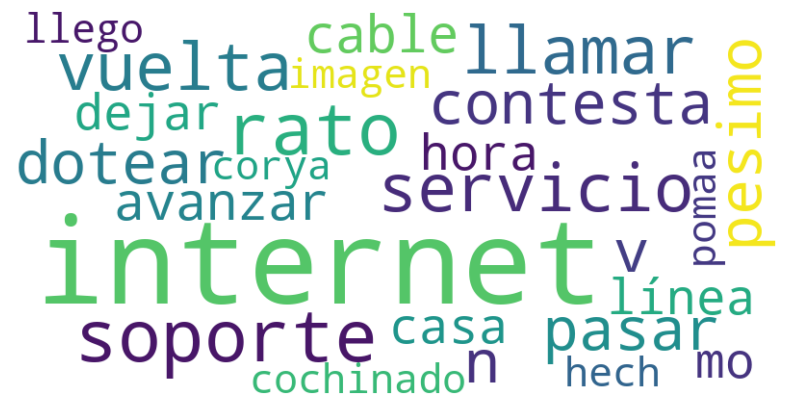

In [68]:
ids = list(merged_df[(merged_df["topic"] == "Internet, publicidad, servicios y soporte") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [69]:
comments

['tampoco internet',
 'si internet tanto malo avanzar dar vuelta vuelta peor carrusel dio mio',
 'lagrima comteco cable internet nunca poder bien dejar satisfecho client',
 'internet poder cargar bajo velocidad internet',
 'internet cruzar línea llamo casa contesta persona',
 'querer dotear internet',
 'disculpar internet hacer hora necesitar respuesta',
 'dia so portar ma cochinado imagen router internet',
 'par pues tmr v llego hech pomaa dotear rato internet ctm v',
 'internet chat decir ausente paso',
 'todo tarde internet manera perjudicar',
 'pasar internet igual corto 5',
 'internet mier',
 'internet ninguno computadora pasar',
 'servicio mal pasar internet',
 'día internet descontar factura suponer',
 '3 día computadoro dar internet xjskxksk pasar',
 'internet',
 'pesimo servicio cada rato corya señal internet',
 'internet nadie contesta telefono soporte tecnico seguirar servicio pesimo deficiente vergüenza',
 'internet llamar soporte técnico contestar gana perjudicar gente fav

### Internet, publicidad, servicios y soporte 04/2018

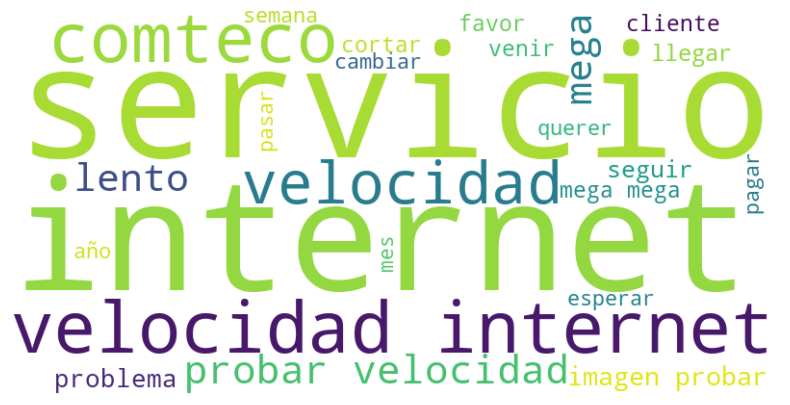

In [70]:
ids = list(merged_df[(merged_df["topic"] == "Internet, publicidad, servicios y soporte") & (merged_df["Posted At"].dt.month == 4) & (merged_df["Posted At"].dt.year == 2018)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet", "Fallas y reclamos", "Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [71]:
comments

['seguir cambio fecho llamar llamar servicio técnico mañana contestar num 4738320 imagen probar velocidad internet',
 'tanto lento últimamente inter cortar cada rato dar gana pagar',
 'mio no él incrementar ninguno velocidad contrario casa diar velocidad ir mal peor',
 'ninguno novedad variar servicio hoy peor nunca malísimo escribir grosería',
 'suceder velocidad pc lentisima decir plano milagro poder entrar facebook dia hoy',
 'problema conexion internet por favor poder ayudar',
 'ayer internet aumento dar solo estan hablar hablar',
 'bien incremento mega jo llegar 4 mega que pasar pues imagen probar velocidad internet',
 'disminuir canal tv cable 108 ahora solo 89 canal',
 '5 mb real que asegurar arreglar problema desconexion',
 '4 abril seguir mismo velocidad duopack',
 'enojado',
 'problema coneccion internet por favor venir solucionar rayo gracias',
 'buena noche noticia subida mega 1ro abril subido todavía hacer hacer alguno tramite favor quisierar saber acceder subida',
 'clien

### Internet, publicidad, servicios y soporte 11/2022

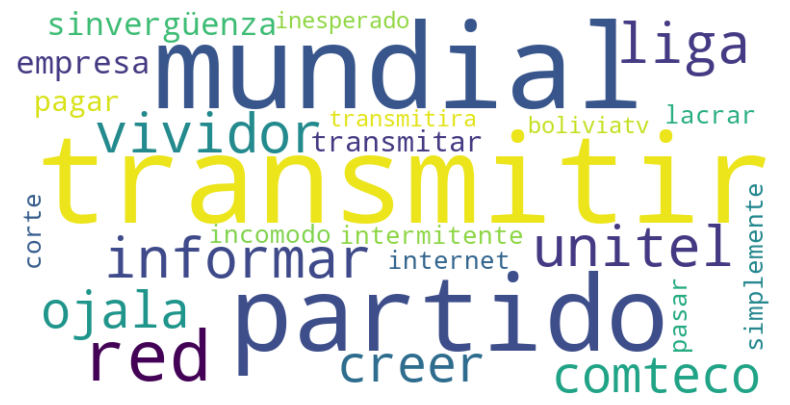

In [72]:
ids = list(merged_df[(merged_df["topic"] == "Internet, publicidad, servicios y soporte") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2022)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [73]:
comments

['tocar ir él entel lacra pasar 64 partido mundial',
 'perdonar momento incomodo internet intermitente simplemente corte inesperado si solo transmitir 64 partido mundial saber boliviatv transmitira 32 partido mundial ojala iluminado comteco adqueír 32 partido transmitido television estatal',
 'pagar ver partido mundial',
 'vergüenza avisen ir transmitir mundial',
 'comunicar ir transmitir mundial creer pagar solicitar autorización transmisión',
 'transmitir partido octavo borrar publicación comunicado',
 'españa golear claro tú sinvergüenza transmitir ojala quiebrir pronto',
 'desastre nisiqueír transmitar partido solo agarrar señal unitel red que transmitir 2 partido 4 cada día far grupo',
 'informar transmitiriar mundial transmitir red tampoco unitel verguenza',
 'maldito chorizo decir transmitir mundial peor farsa corrupto bolivia',
 'ir transmitir partido mundial',
 'ir transmitir mundial',
 'transmitir mundial',
 'mundial decir creer ir transmitir buscar empresa che modo',
 'tomad

### Aplicaciones, facturación, deportes y otros 12/2016

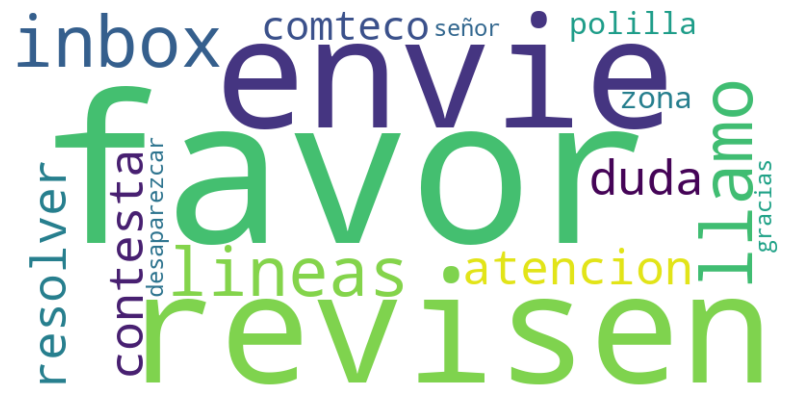

In [74]:
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 12) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [75]:
comments

['señor comteco favor revisen envie inbox llamo lineas atencion resolver duda contesta nadie favor gracias',
 'mas bien desaparezcar polilla zona por favor']

### Aplicaciones, facturación, deportes y otros 01/2017

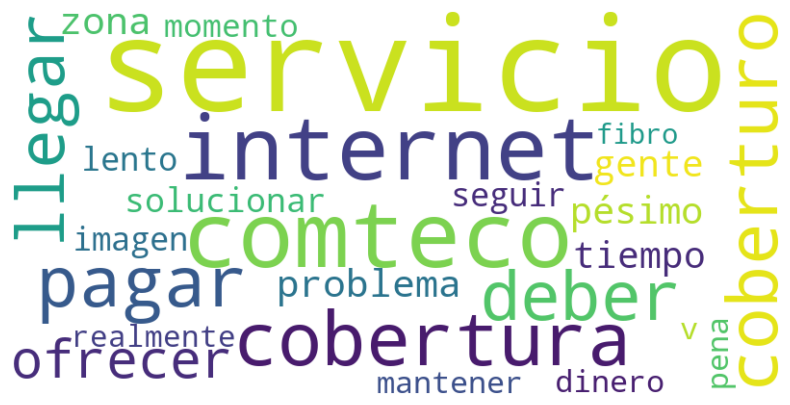

In [76]:
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 1) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [77]:
comments

['aver ahora reclame servicio internet re malo pedir dato ayudarme solucionar problema dar dato llamar momento casa ver lento inter no él si elllo saber bien ahora resultar peor corte cada momento caer internet cada momento oseo reclamar empeoran servicio mm vaya empresa peor empresa parecer quejandono att gente devir tener gente ahi digán no él colmo final cuenta creer socio deveriamo dar denuncia canales televicion tambien tendrar comprado no él verdad lastimo gente comteco parecer solo querer sacarno dinero mas',
 'increíble cinismo respuesta responsable páginar comteco mantener pago responder todo hipocresía 99 reclamo frase traducido lenguaje normal significar importar si cobro sueldo deber ofrecer engañosamente jamás cumplir puesto fibra óptico gran ancho banda contratar misteriosamente peor proveedor servicio acceso internet lucrar mantener él dinero manerar castigarno peor servicio internet todo región deber ser att poner fin vulgar asalto',
 'increíble cinismo respuesta respon

### Aplicaciones, facturación, deportes y otros 03/2017

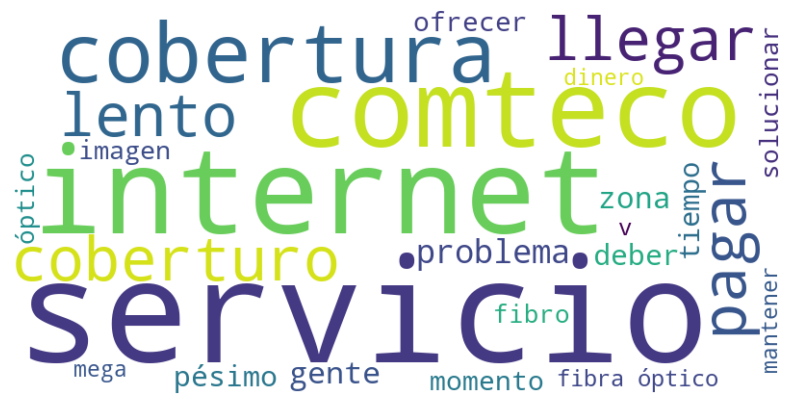

In [78]:
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 1) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión", "Internet", "Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [79]:
comments

['aver ahora reclame servicio internet re malo pedir dato ayudarme solucionar problema dar dato llamar momento casa ver lento inter no él si elllo saber bien ahora resultar peor corte cada momento caer internet cada momento oseo reclamar empeoran servicio mm vaya empresa peor empresa parecer quejandono att gente devir tener gente ahi digán no él colmo final cuenta creer socio deveriamo dar denuncia canales televicion tambien tendrar comprado no él verdad lastimo gente comteco parecer solo querer sacarno dinero mas',
 'salir imagen conexión internet',
 'increíble cinismo respuesta responsable páginar comteco mantener pago responder todo hipocresía 99 reclamo frase traducido lenguaje normal significar importar si cobro sueldo deber ofrecer engañosamente jamás cumplir puesto fibra óptico gran ancho banda contratar misteriosamente peor proveedor servicio acceso internet lucrar mantener él dinero manerar castigarno peor servicio internet todo región deber ser att poner fin vulgar asalto',
 

### Aplicaciones, facturación, deportes y otros 05/2017

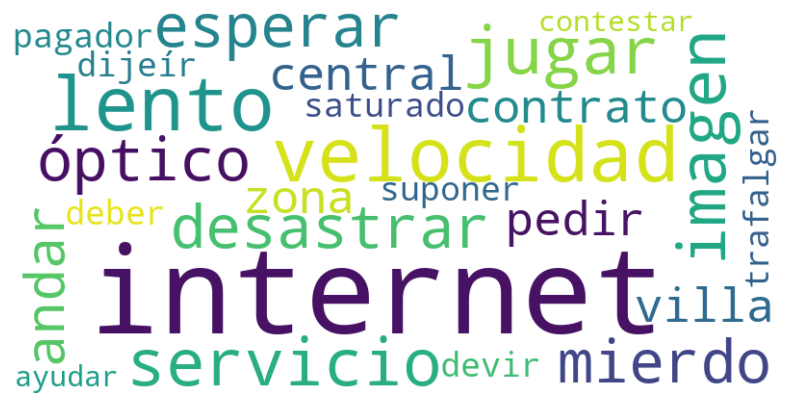

In [80]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 5) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [81]:
comments

['ayeir ala central pedir contrato internet zona villa pagador trafalgar dijeír saturado ahora devir hacer esperar u cosa',
 'terrible numero suponer deber ayudar nunca contestar dejar esperar hora si serviciir internet dar',
 'maldito ladrón internet servir',
 'internet desastrar servicio alguien poder recomendar empresa favor',
 'haber maleante mierdo casi cargo ordenador x caído mierda internet cada rato manguir maleante',
 'señal internet andar cortar lunes llama soporte decir reinici modem',
 'robar frente entel fibro óptico mejor velocidad tecnología menos precio imagen servicio internet competencia',
 'si mas lento lento',
 'fibra óptico lástima decir internet lento ahora mismo encuentro internet técnico ver arreglar arruinar',
 'tomo subir foto imagen probar velocidad internet',
 'si andar lento internet solo querer jugar dota poder jugar online bien laggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggggg',
 'maldito pago bs 500 internet velocidad baja

### Aplicaciones, facturación, deportes y otros 11/2017

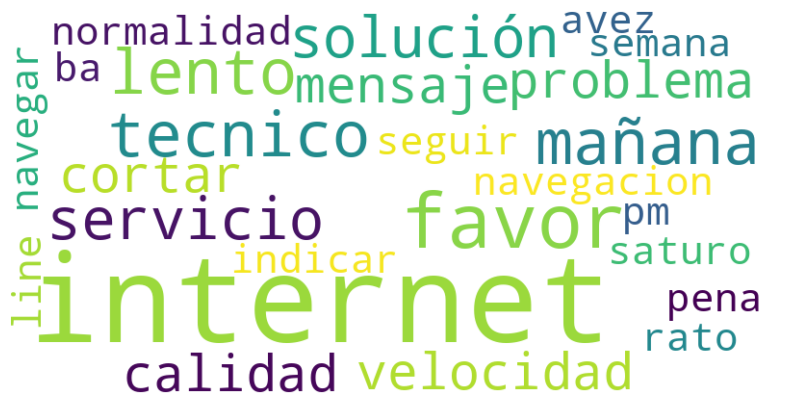

In [82]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet", "Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [83]:
comments

['perdon esla navegacion velocidad internet',
 'problema internet comteco',
 'mejorar calidad internet por favor dar mucho pena poder navegar normalidad avez saturo ret complicado',
 'internet cortar cada rato aún así seguir indicar dato cargo',
 'poder dar baja wifi por favor pesimo internet',
 'buena tarde todo mañana servicio internet favor solución definitivo',
 'pasar internet mañana internet solucionenlo',
 'pasar internet todo mañana todo tarde internet',
 'problema internet ba 7 pm 8 am llevar 5 dias asi',
 'llevar semana internet line telefonico algun tecnico poder solucionar problema',
 'caro porquerio internet',
 'internet servicio tecnico decir esperar 3 dia saber mas casi todo cuadra telefono internet verguenzo cochabamba',
 'si problema velocidad internet lento ayer ping 530 jugar online poder',
 'mandir mensaje querer solución internet llevar casi 1 semana internet',
 'inter lento hacer dos dia',
 'internet',
 'chistoso mensaje pre grabado cubrir malo calidad internet',


### Aplicaciones, facturación, deportes y otros 03/2020

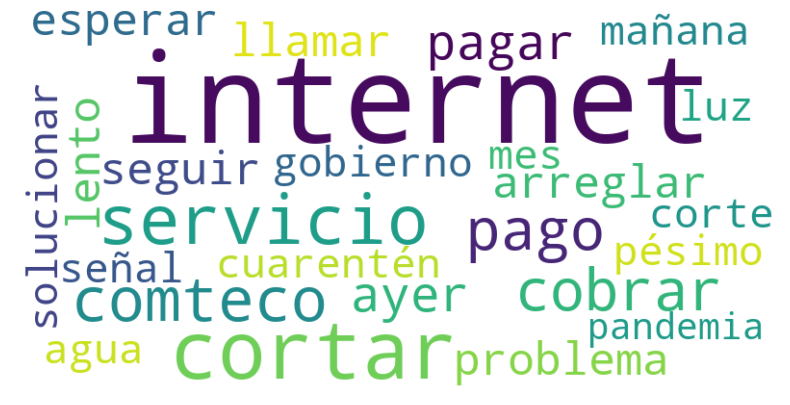

In [84]:
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 3) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [85]:
comments

['igualmente internet llamar día ayer nadie contesta telefono',
 'pagar internet servicio momento llegar mega',
 'hacer cortarno día cuarentén saber pagar tarjeta mediante internet',
 'lento comteco maleant sinverguenza',
 'chistir día lento comteco sinvergüenza',
 'menos aprovechar cuarentena arreglar pésimo internet',
 'maleante peor internet',
 'macana dar internet',
 'suponer que poder cortar internet cuarentenar',
 'informar gobierno dicto cortario agua luz internet',
 'sábado mañana comenzar cuarentén arreglar internet 5 día solo pedir información hacer ojalá factura gran descuento pésimo servicio clases online internet',
 'hola alguien saber hacer corte internet llamo llamo atender',
 'pago internet onlinar reclamo técnico cuarentenar',
 'ir poder internet cortar cada 5 minuto',
 'buen cobrar internet vano llamar',
 'internet hacer día prohibido cortar internet',
 'desgracia internet super lento encima único pensar cobrar sacr m',
 'cobrar inventar solucionar problema velocidad 

### Aplicaciones, facturación, deportes y otros 04/2020

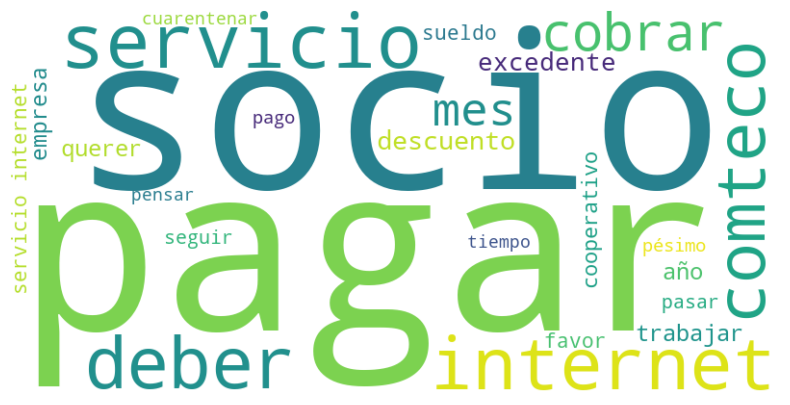

In [86]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 4) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet", "Fallas y reclamos", "Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [87]:
comments

['gastar material escritorio luz agua rebajar costo operación día cuarentenar sólo deber gastar sueldo personal deber ser minimamente 40 rebajar tarifa mes considerado cooperir socio',
 'rebajar 50 tres mes solo vo distinto factor mal servicio',
 'miseria hacer pensar cambiar yo empresa',
 'deber ser 50 cuarentena siquiera oficinar mes utilizamos seguir correr pago',
 'penar socio beneficio hoy diar telefonico gasto inversion',
 'si penar tú sólo piensir cobrar si saber acatamos cuarentena día salido solo ir abastecernos lugar ir pagar contar servicio banco cooperativo cerca casa pena',
 'deber seriar cobrar solo mitad lamentablemente ver claramente preocupar socio solo querer ganar pena',
 'terrible inhumano',
 'factúra marzo poder pagar mucho entidad financiero estar abierto estar pagar bono deber agilizar tema ir acumular deuda servicio',
 'deveriar dar alo socio bono viver x k dar exedent corrupto m',
 'encanto comteco burlar socio escupar cara xd',
 'gobierno ar cooperativo corrup

### Aplicaciones, facturación, deportes y otros 10/2022

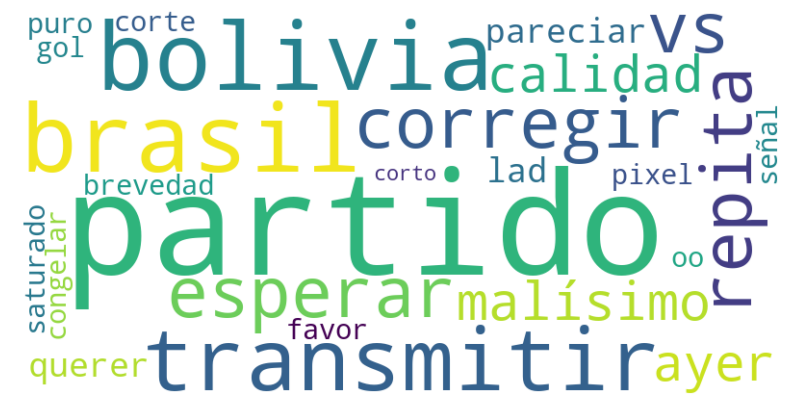

In [88]:
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 10) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [89]:
comments

['corto partido bolivia vs brasil poder corregir brevedad posible lrmqlp',
 'estimado favor esperar hoy repita malísimo calidad transmitir partido ayer dar alguno solución',
 'ayer partido pareciar 3 pixel borrozo',
 'partido paraguay venezuela',
 'transmitir partido mundial',
 'padir partido ahora querer ver lad 9 oo am',
 'app bastante saturado partido brasil congelar bastante video',
 'canal dar partido',
 'partido',
 'mejor transmitir partido bolivia puro desepcion',
 'partido ir tener mas corte gol pues comtecir',
 'pasar señal partido señor']

### Aplicaciones, facturación, deportes y otros 02/2023

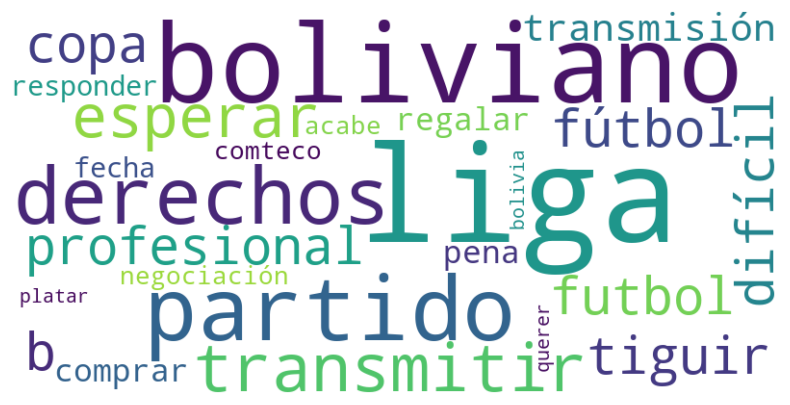

In [90]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Aplicaciones, facturación, deportes y otros") & (merged_df["Posted At"].dt.month == 2) & (merged_df["Posted At"].dt.year == 2023)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [91]:
comments

['partido liga esperar solo final',
 'plata regalar b transmitir liga',
 'querer liga bolivia',
 'preocupense comprar derechos liga fútbol boliviano pena transmitir',
 'partido liga profesional futbol boliviano tanto difícil responder señor',
 'favor liga boliviano copa tiguir aunque partido fecha transmitir',
 'proceso negociación derechos transmisión liga llevar día esperar acabe torneo',
 'liga boliviano',
 'siii comteco liga boliviano',
 'ir transmitir partido liga boliviano',
 'cuándo esperaremos si derechos liga']

### Gestión del perfil 04/2015

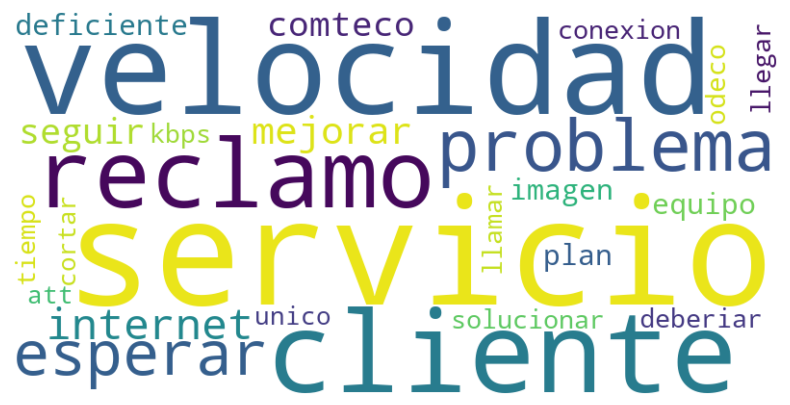

In [92]:
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 4) & (merged_df["Posted At"].dt.year == 2015)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [93]:
comments

['decir doble velocidad seguir mismo medio velocidad siempre',
 'sr comteco razon ahora responder reclamo cliente personalmente esperar tener velocidad contratado brevedad velocidad tanto deficiente teoricamente doble embargo ahora 16 24 64 kbps dar estimado 2 kb seg descarga 8 kb seg pseudo mejora creer cliente estabamo relativamente conforme pesar tremendo caida si seguir asi recomendare contrario hacia dare comentario negativo conocer probablemente afectar sobremanera embargo mostrare vivo cuan deficiente servicio asi logs registro screenshot prueba testeo ancho bando velocidad transferencio ojo transferencio colocar contrato asi velocidad descargo ahhh olvidemono buscar tipica excús equipo virus uso linux asi mac asi culpar antemano siempre cliente equipo computo ir funcionar menos unico equipo enlazado red podiar realizar videoconferencia problema alguno curso virtual menos indicar podia ver video streaming problema cosa ahora imposible incluso navegar problema pagina dinamica est

### Gestión del perfil 11/2016

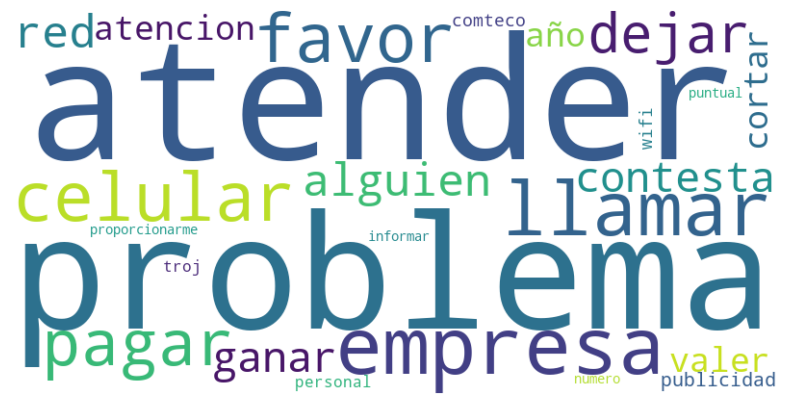

In [94]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fallas y reclamos", "Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [95]:
comments

['cobrar atender cometo franklin',
 'internat macana',
 'asi querer que pagar puntual mmmm dios',
 'cada minuto que ir conexcion gran perdido dinero',
 'informar problema malo conexión',
 'alguien podrio proporcionarme numero reclar llamo dejar nadie atender wifi hacer 3 dia',
 'no él razón cambio solo nombre contraseño red wifi acabar llamar contesta si alguien paso',
 'puro basura',
 'peor empresa bolivio',
 'sólo servir llamar navegar',
 'bajo señal solo capa exteriores',
 'macana nesecita si si celular que android si suponer que deber alcanzar deberio dar cualquiera celular tons poner comercial celular canchero',
 'seguir ibternet ir 2 dias si personal que saber atender',
 'si tan solo supiernar gente putear pendejo',
 'mal poder organizar ir quemar lento comteco peor empresa ciudad',
 'basura puro maleant',
 'día ínternet dar pinxhe  ganar atender teléfono',
 'deberiar informar cual problema conexion ir 2 dias asi',
 'cable medio diar zona troj atencion cliente saber quedar troj',

### Gestión del perfil 03/2020

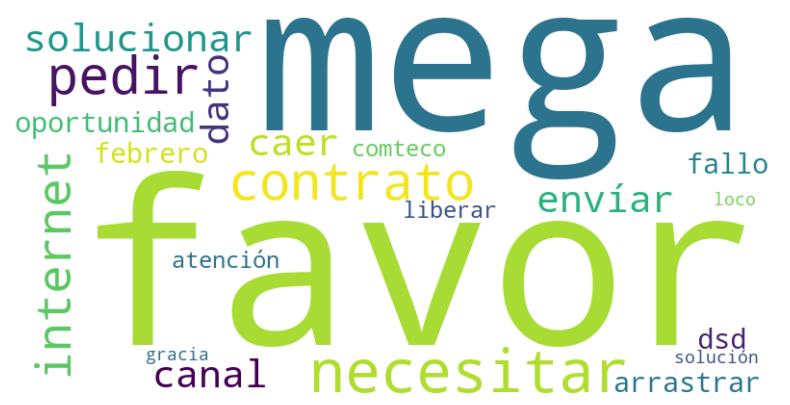

In [96]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 3) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [97]:
comments

['comteco liberar canal favor hacer loco',
 'favor internet bajo 4 mega contrato 20 megas favor necesitar solución',
 'comteco favor necesitar internet bajo caer contrato 20 mega pedir solucionar envíar varios vez dato pedir varios oportunidad falla arrastrar dsd febrero favor necesitar atención gracias']

### Gestión del perfil 12/2020

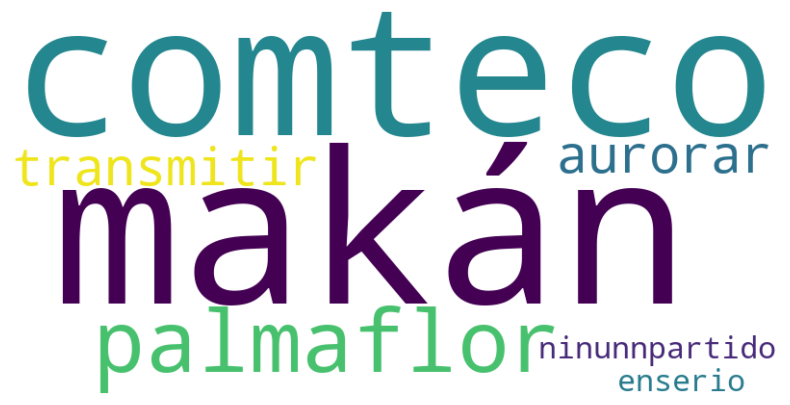

In [98]:
# Internet, publicidad, servicios y soporte 11/2022
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 12) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [99]:
comments

['ninunnpartido transmitir makán comteco palmaflor aurorar mal enserio']

### Gestión del perfil 11/2022

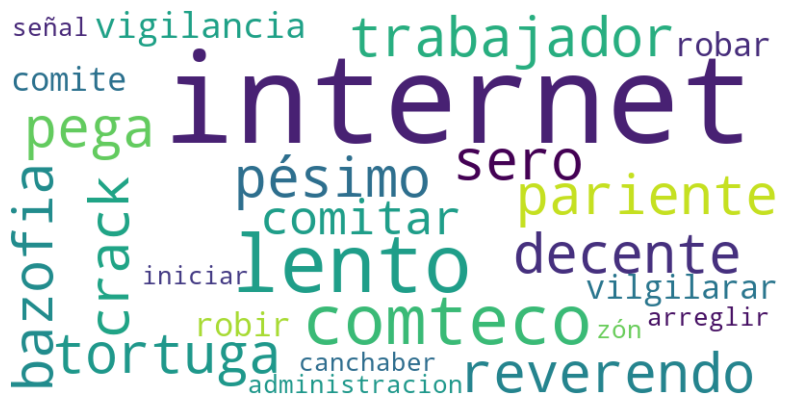

In [100]:
ids = list(merged_df[(merged_df["topic"] == "Gestión del perfil") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2022)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet", "Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [101]:
comments

['internet lento',
 'peor empresa internet sinceramente',
 'comteco gaver internet',
 'fallar internet exámen',
 'ahora internet',
 'seguir lento internet',
 'solucionar internet mas tortuga cobrar 1',
 'arreglir internet vez',
 'siempre fallar pésimo servicio internet',
 'internet fallar solo',
 'internet mierdo',
 'pasar lento comteco dar pega pariente trabajador crack tener internet decente reverendo bazofia sero comite vigilancia vilgilarar robir robar comite administracion complicidad dueño',
 'paso internet pésimo',
 'asta hora internet',
 'lento nuevamente internet',
 'solucionar problema internet',
 'arreglir internet poder ver mindial',
 'porquerio internet mas lento',
 'pues lcdtm partido iniciar señal tiesa maradona',
 'lentoooooo internett',
 'comteco paso internet',
 'pensar juego mal resultar internet',
 'porfa arreglir internet zón canchaber anoche corto conecta primero vez fallo',
 'e4sta lento internet arreglenlo dios mio poder hacer']

### Fútbol, deportes y televisión 04/2016

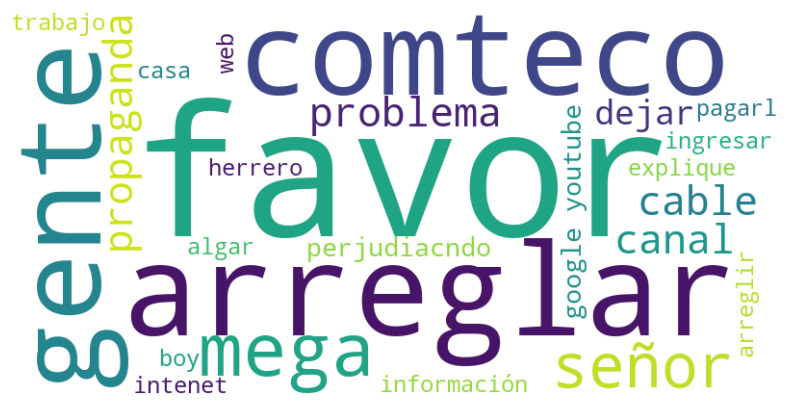

In [102]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 4) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [103]:
comments

['dejar mentir favor',
 'pasar pagina web poner información ahí casa herrero cuchillo palo',
 'paso google youtube ingresar algar explique conteco favor',
 'por favor vez google youtube arreglir señor comteco por favor trabajo intenet estar perjudiacndo dos dias boy poder pagarl si trabjo por favor concientes estar perjudiacndo',
 'tú esperar qye pager haata uñtimo sentavo gente recien activar nuevo wifi entender por favor acargo arreglar problema gente emprés poder seguir aguantar gente cansado rogar él arreflar cable llegar casi semana despues ppdriar escuchar noticia ppr favor arreglar formar administrar',
 'por favor velocidad internet bajado mega ayes recuperar 2 5 mega deberio tener gustaria ayudar empeore mas por favor',
 'querido amigo comteco dejar interrumpir por favor programacion propaganda canal tv cable propaganda ruidoso usen  dos canal cualquiera informacion',
 'decir llegario 3 mega ahora por favor arreglar problema mas pronto posible nombre lisby fernandez telefono 43

### Fútbol, deportes y televisión 06/2016

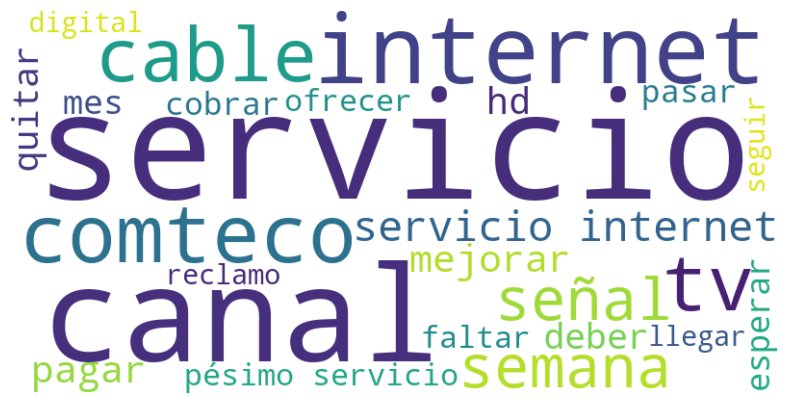

In [104]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 6) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet", "Fallas y reclamos"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [105]:
comments

['quitar previo aviso canal entertaiment',
 'que costo ir tenerb',
 'comtecir todo tecnología recién ofrecer tv digital nuevo servico actual servicio pésimo servicio cliente pésimo rodear dinosaurio mediocre preparación seguir esperar 30 minuto vivo ofrecer paquete concom att deber multar él publicidad engañoso',
 'bueno seguir esperar conectar nuevo sistema pese hacer contrato prevento incluso llamar instalación aparecer ir 3 semana esperar',
 'solicite tv cable 6 junio ahora llegar mes mal servicio',
 'fraude internet lento poder ser tiempo cortar pesar antén inalambrico corto tiempo pésimo comteco',
 'disculpir primero solicite servicio fecha llamar decir yo espere fin semana perdi fin semana esperandol si acaso aparecer quejar empresa dijeír ir fecha completo desorden empresa',
 'tiguir star llevar año luz',
 'estimado hacer reclamo hacer semana corte repentino servicio tv digital dar respuesta favor responder',
 'llorar',
 'llorar',
 'responder imbox',
 'seguro malo servicio ofrec

### Fútbol, deportes y televisión 10/2016

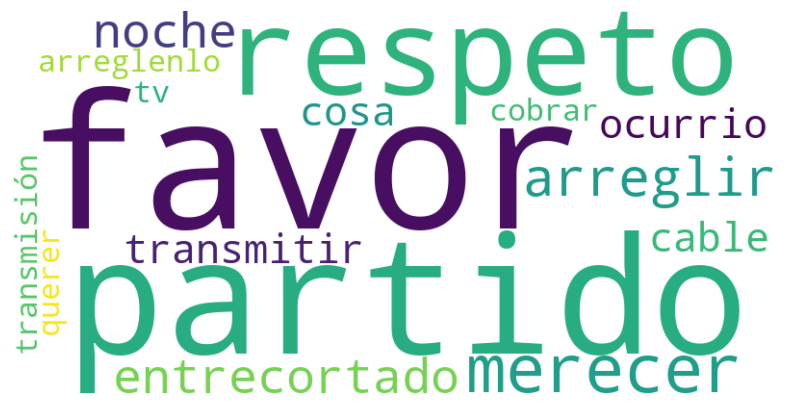

In [106]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 10) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [107]:
comments

['querer ver partido por favor arreglenlo',
 'dar tv cable respeto merecer favor arreglir cosa cobrar',
 'por favor transmitir entrecortado partido noche ocurrio anterior transmisión']

### Fútbol, deportes y televisión 11/2016

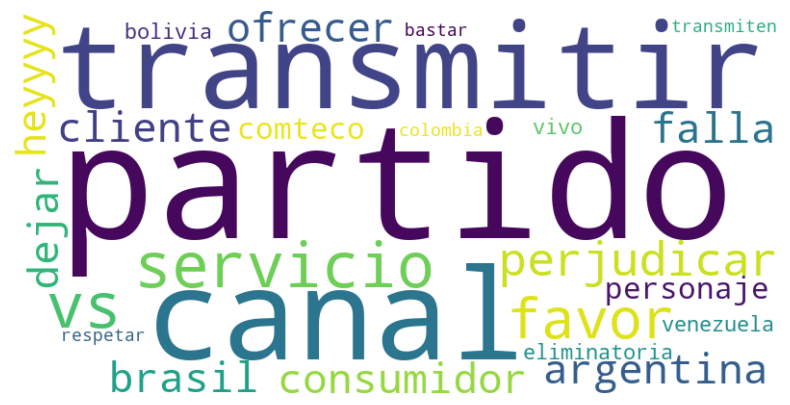

In [108]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 11) & (merged_df["Posted At"].dt.year == 2016)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Solicitud de información", "Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [109]:
comments

['pelotud mejor partido brasil argentina transmiten satelital',
 'favor respetar cliente consumidor servicio por favor decir falla cuanto mas perjudicar si dejar ofrecer servicio perjudicar',
 'siempre transmitir mismo partido 3 canal heyyyy personaje comteco informo eliminatoria 5 partido 3',
 'inútil transmitir 3 canal mismo partido venezuela vs bolivia bastar hacer él canal',
 'dar partido colombia vs chile',
 'mal demá partido transmitir vivo verlo diferido']

### Fútbol, deportes y televisión 07/2017

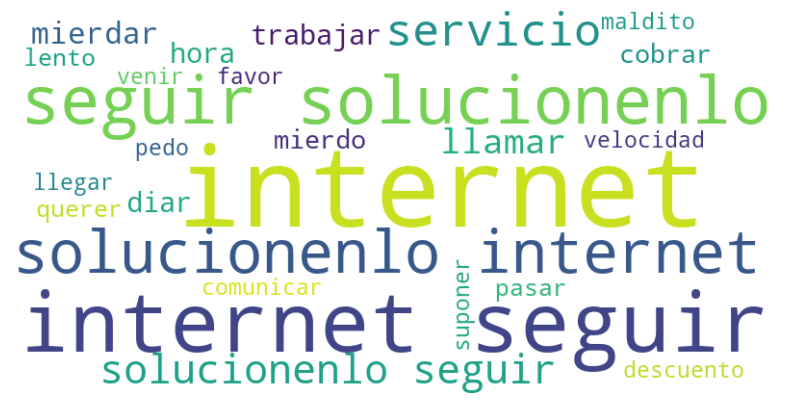

In [110]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 7) & (merged_df["Posted At"].dt.year == 2017)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Internet"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [111]:
comments

['primero mejorar servicio pesimos internet',
 'internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo',
 'mierdar servicio diar lento internet demas llamar hdp',
 'comteco mierdar dio ir venir pt internet paso lento',
 'arreglir internet andar demasiado lento llegar velocidad megabyt solo llegar 500 kbps suerte',
 'internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo internet seguir mal solucionenlo',
 'poder v

### Fútbol, deportes y televisión 02/2022

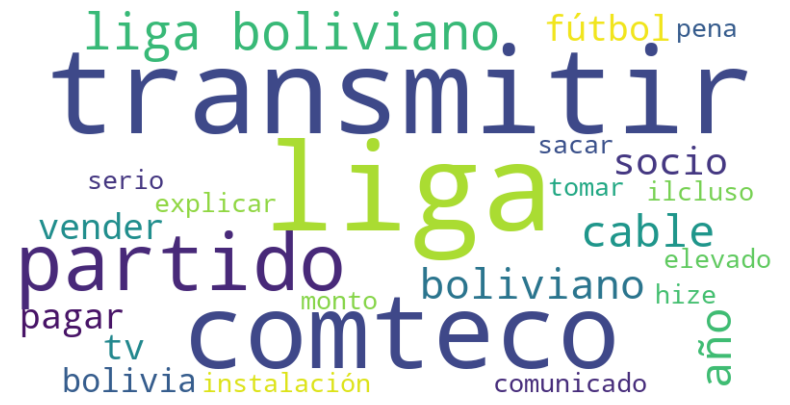

In [112]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 2) & (merged_df["Posted At"].dt.year == 2022)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [113]:
comments

['transmitir liga boliviano',
 'liga nunca',
 'transmiten liga',
 'comteco podriar sacar comunicado explicar ahora transmitir partido liga boliviano',
 'dar ganar pasar liga boliviano',
 'liga cada año mismo hue',
 'n partido bolivar',
 'liga copa sudamericano',
 'liga boliviano aún que 4 equipo cochabamba',
 'preguntar año transmitir liga hize instalación comteco decir año si transmitir aún serio cobrar factura',
 'exigir liga boliviano',
 'liga boliviano pena año liga',
 'haber señor gerencia de comteco transmitir partido de liga boliviano ilcluso pagar monto elevado cable tomar encuentar futbol nacional',
 'liga boliviano',
 'liga boliviano cada inicio año mismo',
 'comteco peor castigo socio nunca liga boliviano',
 'caraj liga',
 'si favor hacer transmitir liga bolivia',
 'liga boliviar',
 'liga cara',
 'dar información tigo querer vender liga fútbol boliviano comteco tv cifra demasiado alto servicio cable vender bajo gobernación alcaldio poder ayudar ser mediador negociación hacer

### Fútbol, deportes y televisión 03/2022

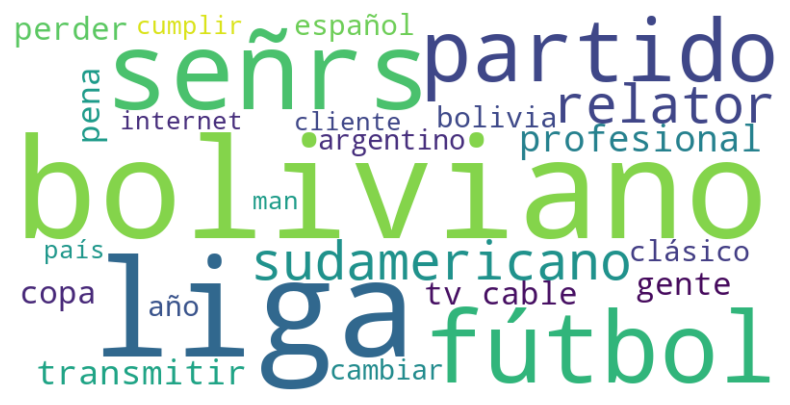

In [114]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 3) & (merged_df["Posted At"].dt.year == 2022)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [115]:
comments

['liga boliviano',
 'mejorar internet conprar decho liga profesional fútbol boliviano si perdéran cliente',
 'liga sólo robar cumplir prometido',
 'liga boliviano',
 'liga boliviano',
 'verdadero fútbol tronco liga boliviano',
 'liga boliviano año mismo',
 'liga boliviano',
 'liga boliviano',
 'bien man u vs man city querer ver partido wilster aurora xd elección prometer liga boliviano cumplir comteco',
 'liga boliviano',
 'liga boliviano',
 'exigir liga boliviano interés país',
 'liga boliviano',
 'liga boliviano',
 'liga boliviano cada año solo poner excusa',
 'liga boliviano',
 'liga boliviano',
 'gracias transmitir partido barcelona',
 'división profesional fútbol boliviano cuándo',
 'conmebol libertador conmebol sudamericano falta transmitir',
 'canal normal tv cable comprarar tú mismo liga copa sudamericano dar cuenta cuánto cliente perder mensualmente solo llenar bolsillo pues que invertir',
 'caraj trasmitiran fútbol boliviano 4 equipo cochabamba',
 'transmitir liga libertador 

### Fútbol, deportes y televisión 07/2022

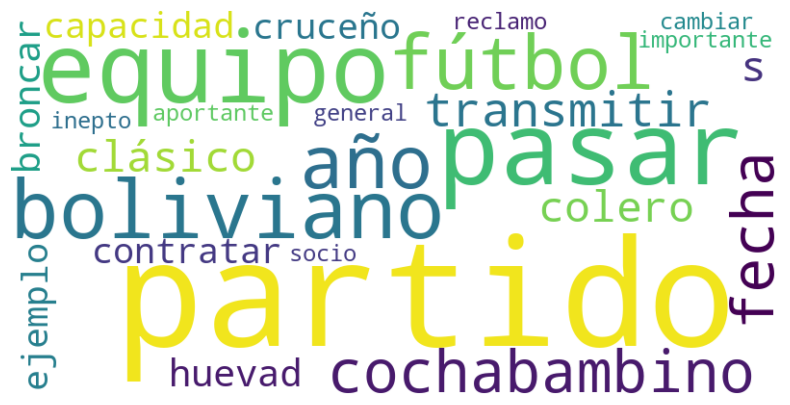

In [116]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.month == 7) & (merged_df["Posted At"].dt.year == 2022)]["ID"])
comments = list(df_comments[(df_comments["topic"].isin(["Fútbol, deportes y televisión"])) & (df_comments["Sentiment_Pysentimento"] == "NEG") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [117]:
comments

['decir hoy liga',
 'vez liga fútbol boliviano que broncar cada año mismo huevad 4 equipo cochabambino s así capacidad contratar fútbol boliviano cada año mal peor comteco',
 'ahora mismo transmitir ninguno partido',
 'ahora mismo transmitir ninguno partido',
 'partido hoy',
 'partido publicidad fraudulentar',
 'dar partido',
 'vez mejor partido fecha transmit capo',
 'jugar palmaflor aún transmitir',
 'partido aurora que pasarar',
 '4 partido 8 verguenza',
 'transmitir partido',
 'dar partido solo clásico cruceño dar ejemplo varios partido importante pasar',
 'transmitir partido inepto cambiar tigo colmo',
 'huevado deber pasar partido general solo equipo cochabambino s',
 'adquirir ver clásico paceño transmitir',
 'insulto cuota poner partido relevancio',
 'reclamar porqué 8 partido fecha solo pasar 4 peor partido equipo colero reclamo socio aportante cable pasar partido primero 4 campeonato interesar colero',
 'tanto propaganda transmitir partido importante']

## Wordcloud por tópico de comentarios

In [118]:
texts = [
    "Problemas de velocidad del servicio de Internet",
    "Problemas del servicio de Internet",
    "Reclamos programación televisiva y problemas del servicio de Internet",
    "Problemas de corte del servicio de Internet",
    "Problemas de señal en transmisión televisiva de fútbol",
    "Problemas de comunicación para soporte",
    "Problemas de señal en transmisión televisiva de fútbol y reclamos de falta de transmisión de partidos",
    "Problemas de comunicación para soporte",
    "Problemas de velocidad del servicio de Internet y reclamos de cobertura",
    "Problemas de velocidad del servicio de Internet y reclamos de cobertura",
    "Problemas del servicio de Internet",
    "Solicitan la copa confederaciones y la liga",
    "Problemas del servicio de Internet",
    "Problemas del servicio de Internet",
    "Problemas del servicio de Internet",
    "Problemas de velocidad del servicio de Internet",
    "Problemas de velocidad del servicio de Internet y solicitan no cortar el servicio de Internet por pandemia",
    "Problemas de velocidad del servicio de Internet",
    "Solicitan no pagar el servicio de Internet por no usar en pandemia y reclaman derechos como socios",
    "Problemas de señal en transmisión televisiva de fútbol",
    "Reclamo de falta de transmisión de partidos",
    "Solicitan la liga de fútbol boliviano",
    "Solicitan la liga de fútbol boliviano",
    "Solicitan la liga de fútbol boliviano",
    "Solicitan la transmisión del mundial",
    "Problemas del servicio de Internet",
    "Solicitan la liga de fútbol boliviano",
]

In [119]:
import re
from nltk import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import spacy

In [120]:
nlp = spacy.load("es_core_news_sm")

In [121]:
def preprocess_text(text):
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc if not token.is_punct and not token.is_stop]
    return tokens

# Create 3-grams
def generate_ngrams(tokens, n=3):
    ngrams = zip(*[tokens[i:] for i in range(n)])
    return [" ".join(ngram) for ngram in ngrams]

In [122]:
all_ngrams = []
for text in texts:
    tokens = preprocess_text(text)
    ngrams = generate_ngrams(tokens, n=3)
    all_ngrams.extend(ngrams)

In [123]:
text_for_wordcloud = " ".join(all_ngrams)

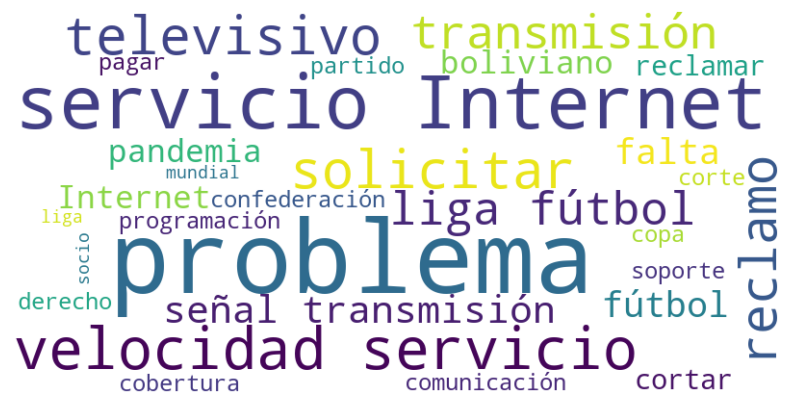

In [124]:
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(text_for_wordcloud)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

# Interacción Positiva

## 13/03/2020

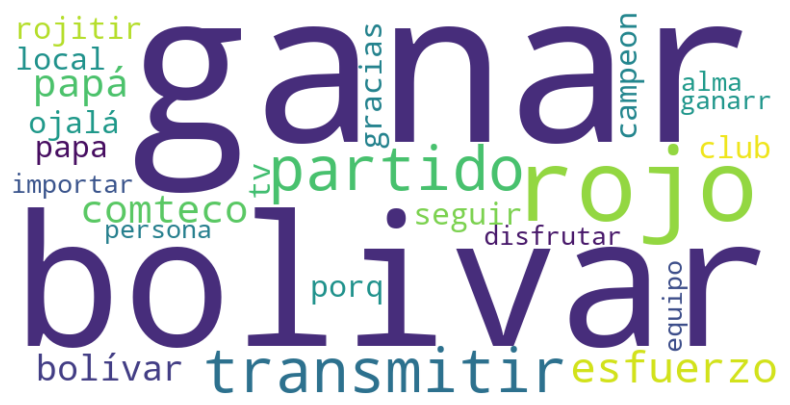

In [128]:
ids = list(merged_df[(merged_df["topic"] == "Fútbol, deportes y televisión") & (merged_df["Posted At"].dt.day == 13) & (merged_df["Posted At"].dt.month == 3) & (merged_df["Posted At"].dt.year == 2020)]["ID"])
comments = list(df_comments[(df_comments["Sentiment_Pysentimento"] == "POS") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

## 23/02/2023

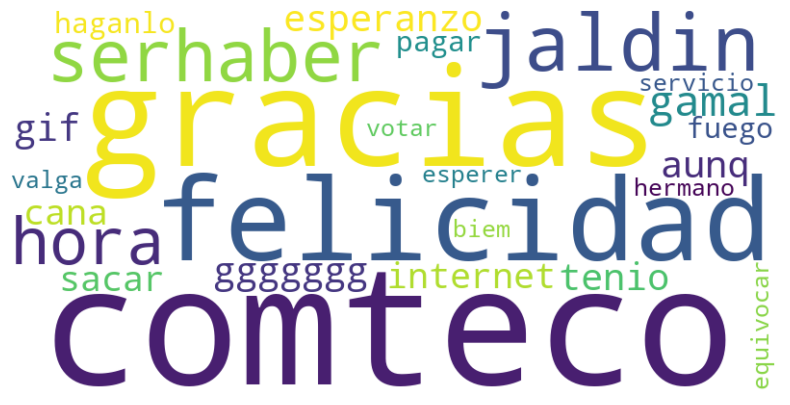

In [129]:
ids = list(merged_df[(merged_df["Posted At"].dt.day == 23) & (merged_df["Posted At"].dt.month == 2) & (merged_df["Posted At"].dt.year == 2023)]["ID"])
comments = list(df_comments[(df_comments["Sentiment_Pysentimento"] == "POS") & (df_comments["ID"].isin(ids))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)

In [134]:
ids

[2323, 2324, 2325, 2326, 2327, 2328, 2329]

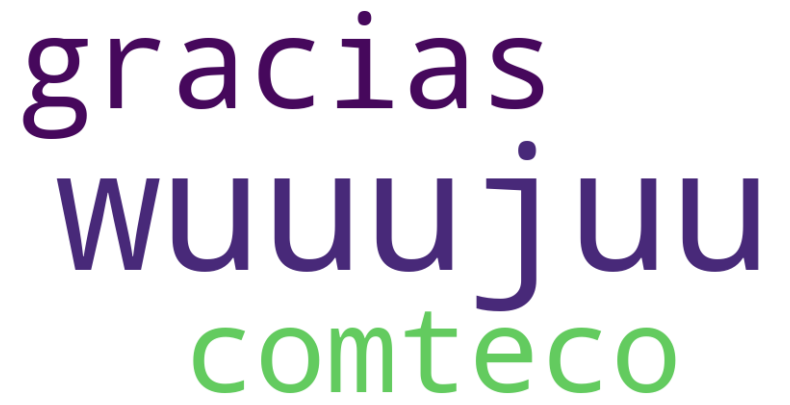

OK - 2323


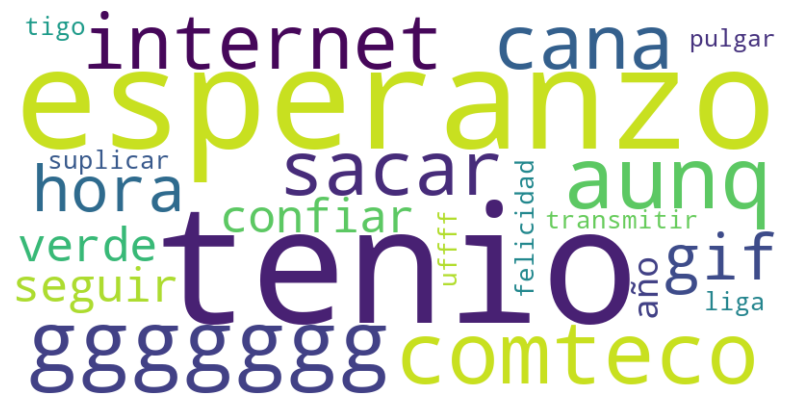

OK - 2324
Bad - 2325


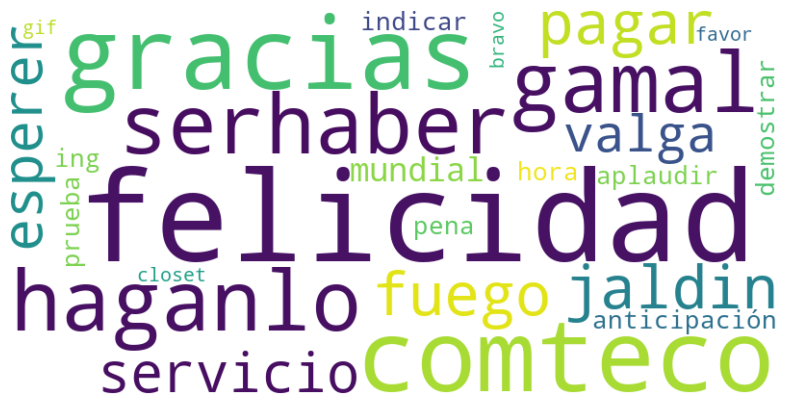

OK - 2326


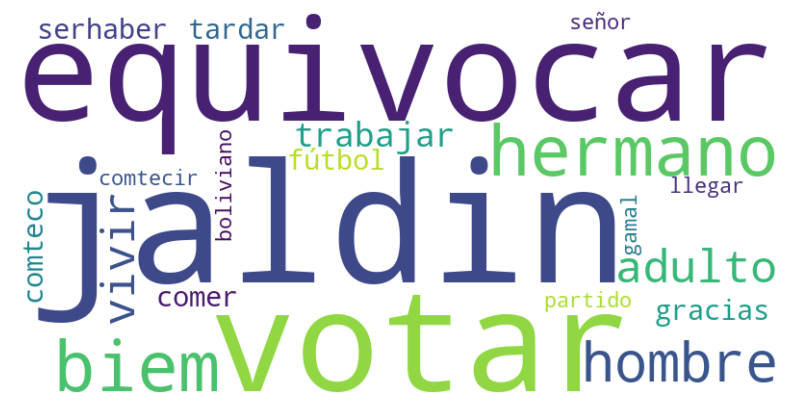

OK - 2327
Bad - 2328
Bad - 2329


In [137]:
for id in ids:
    try:
        comments = list(df_comments[(df_comments["Sentiment_Pysentimento"] == "POS") & (df_comments["ID"].isin([id]))]["comments_no_emoji"])
        plot_wordcloud_n_grams(comments)
        print(f"OK - {id}")
    except:
        print(f"Bad - {id}")

In [ ]:
comments = list(df_comments[(df_comments["Sentiment_Pysentimento"] == "POS") & (df_comments["ID"].isin([2323]))]["comments_no_emoji"])
plot_wordcloud_n_grams(comments)